<a href="https://colab.research.google.com/github/dkbean/Improved-stability-of-WGAN-GP/blob/main/6.%20WGAN-GP%20CelebA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!mkdir generator

In [ ]:
#Create folders to save 3000 generated images for each n epochs
import os
import subprocess

n=10
# Specify the base folder where you want to create the subfolders
base_folder = ""  # Replace with your desired base folder path


# Create 15 folders with the specified naming pattern
for x in range(0, 801, n):
    folder_name = f'celebGenerated_wgan_{x}epochs'
    folder_path = os.path.join(base_folder, folder_name)

    try:
        os.makedirs(folder_path)
        print(f"Created folder: {folder_path}")
    except FileExistsError:
        print(f"Folder already exists: {folder_path}")

print("Folders created successfully.")

Created folder: celebGenerated_wgan_0epochs
Created folder: celebGenerated_wgan_10epochs
Created folder: celebGenerated_wgan_20epochs
Created folder: celebGenerated_wgan_30epochs
Created folder: celebGenerated_wgan_40epochs
Created folder: celebGenerated_wgan_50epochs
Created folder: celebGenerated_wgan_60epochs
Created folder: celebGenerated_wgan_70epochs
Created folder: celebGenerated_wgan_80epochs
Created folder: celebGenerated_wgan_90epochs
Created folder: celebGenerated_wgan_100epochs
Created folder: celebGenerated_wgan_110epochs
Created folder: celebGenerated_wgan_120epochs
Created folder: celebGenerated_wgan_130epochs
Created folder: celebGenerated_wgan_140epochs
Created folder: celebGenerated_wgan_150epochs
Created folder: celebGenerated_wgan_160epochs
Created folder: celebGenerated_wgan_170epochs
Created folder: celebGenerated_wgan_180epochs
Created folder: celebGenerated_wgan_190epochs
Created folder: celebGenerated_wgan_200epochs
Created folder: celebGenerated_wgan_210epochs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pytorch-fid

In [ ]:
# !pip uninstall tensorflow -y


In [ ]:
# !pip install  tensorflow==2.8.0

In [ ]:
!unzip /content/drive/MyDrive/celeb_test.zip -d ./

Archive:  /content/drive/MyDrive/celeb_test.zip
   creating: ./celeb_test/
  inflating: ./celeb_test/celeb_429.jpg  
  inflating: ./celeb_test/celeb_812.jpg  
  inflating: ./celeb_test/celeb_287.jpg  
  inflating: ./celeb_test/celeb_1096.jpg  
  inflating: ./celeb_test/celeb_1442.jpg  
  inflating: ./celeb_test/celeb_1856.jpg  
  inflating: ./celeb_test/celeb_1120.jpg  
  inflating: ./celeb_test/celeb_783.jpg  
  inflating: ./celeb_test/celeb_2591.jpg  
  inflating: ./celeb_test/celeb_305.jpg  
  inflating: ./celeb_test/celeb_1577.jpg  
  inflating: ./celeb_test/celeb_2713.jpg  
  inflating: ./celeb_test/celeb_1758.jpg  
  inflating: ./celeb_test/celeb_23.jpg  
  inflating: ./celeb_test/celeb_268.jpg  
  inflating: ./celeb_test/celeb_17.jpg  
  inflating: ./celeb_test/celeb_419.jpg  
  inflating: ./celeb_test/celeb_729.jpg  
  inflating: ./celeb_test/celeb_2539.jpg  
  inflating: ./celeb_test/celeb_1255.jpg  
  inflating: ./celeb_test/celeb_2746.jpg  
  inflating: ./celeb_test/celeb_13

In [ ]:
!unzip /content/drive/MyDrive/celeb_train_20k.zip -d ./

Streaming output truncated to the last 5000 lines.
  inflating: ./celeb_train_20k/015536.jpg  
  inflating: ./celeb_train_20k/015537.jpg  
  inflating: ./celeb_train_20k/015538.jpg  
  inflating: ./celeb_train_20k/015539.jpg  
  inflating: ./celeb_train_20k/015540.jpg  
  inflating: ./celeb_train_20k/015541.jpg  
  inflating: ./celeb_train_20k/015542.jpg  
  inflating: ./celeb_train_20k/015543.jpg  
  inflating: ./celeb_train_20k/015544.jpg  
  inflating: ./celeb_train_20k/015545.jpg  
  inflating: ./celeb_train_20k/015546.jpg  
  inflating: ./celeb_train_20k/015547.jpg  
  inflating: ./celeb_train_20k/015548.jpg  
  inflating: ./celeb_train_20k/015549.jpg  
  inflating: ./celeb_train_20k/015550.jpg  
  inflating: ./celeb_train_20k/015551.jpg  
  inflating: ./celeb_train_20k/015552.jpg  
  inflating: ./celeb_train_20k/015553.jpg  
  inflating: ./celeb_train_20k/015554.jpg  
  inflating: ./celeb_train_20k/015555.jpg  
  inflating: ./celeb_train_20k/015556.jpg  
  inflating: ./celeb_trai

In [ ]:
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import numpy as np

import os

In [ ]:
! pwd


/content


In [ ]:
print(tf.version.VERSION)

2.15.0


In [ ]:
celeb_data_dir = "/content/celeb_train_20k"

In [ ]:
FID_scores = []
def lastWord(string): # get the FID score from the FID command's result

    # split by space and converting
    # string to list and
    lis = list(string.split(" "))

    # length of list
    length = len(lis)

    # returning last element in list
    return lis[length-1]

In [ ]:
train_images = tf.keras.utils.image_dataset_from_directory(
    celeb_data_dir, label_mode=None, image_size=(64, 64), batch_size=256 # Margaret: increase batch size from 32
)

Found 20535 files belonging to 1 classes.


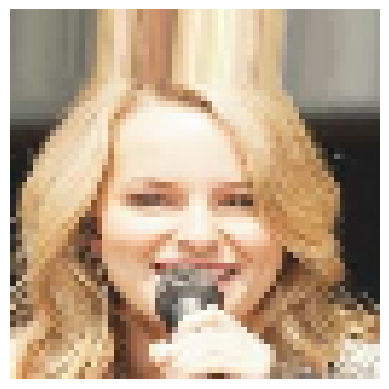

In [ ]:
image_batch = next(iter(train_images))
random_index = np.random.choice(image_batch.shape[0])
random_image = image_batch[random_index].numpy().astype("int32")

# Visualize 1 random image from the training dataset
plt.axis("off")
plt.imshow(random_image)
plt.show()

In [ ]:
def show(images):
    plt.figure(figsize=(4, 4))

    for i in range(16):
        plt.subplot(4, 4, i+1)
        img = keras.utils.array_to_img(images[i])
        plt.imshow(img)
        plt.axis('off')
    plt.show()

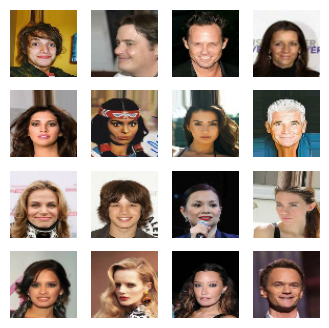

In [ ]:
# Visualize 16 images from the training dataset
show(image_batch[:16])

In [ ]:
# Normalize the images to [-1, 1] which is the range of the tanh activation
train_images = train_images.map(lambda x: (x - 127.5) / 127.5)

In [ ]:
# latent dimension of the random noise
LATENT_DIM = 128

WEIGHT_INIT = tf.keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# number of channels, 1 for gray scale and 3 for color images
CHANNELS = 3

In [ ]:
def build_generator():
    # create a Keras Sequential model
    model = Sequential(name="generator")

    # prepare for reshape: FC => BN => RN layers, note: input shape defined in the 1st Dense layer
    model.add(layers.Dense(8 * 8 * 512, input_dim=LATENT_DIM))
    # model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    # layers.LeakyReLU(alpha=0.2),

    # 1D => 3D: reshape the output of the previous layer
    model.add(layers.Reshape((8, 8, 512)))

    # upsample to 16x16: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(256, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 32x32: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(128, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # upsample to 64x64: apply a transposed CONV => BN => RELU
    model.add(layers.Conv2DTranspose(64, (4, 4),
                                     strides=(2, 2),
                                     padding="same",
                                     use_bias=False,
                                     kernel_initializer=WEIGHT_INIT))
    model.add(layers.BatchNormalization())
    model.add((layers.ReLU()))

    # final layer: Conv2D with tanh activation
    model.add(layers.Conv2D(CHANNELS, (4, 4), padding="same", activation="tanh"))

    # return the generator model
    return model

In [ ]:
# build the generator model
generator = build_generator()

/usr/local/lib/python3.10/dist-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [ ]:
generator.summary()

Model: "generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             4227072   
                                                                 
 re_lu (ReLU)                (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 16, 16, 256)       2097152   
 anspose)                                                        
                                                                 
 batch_normalization (Batch  (None, 16, 16, 256)       1024      
 Normalization)                                                  
                                                                 
 re_lu_1 (ReLU)              (None, 16, 16, 256)       0 

In [ ]:
def build_critic(height, width, depth, alpha=0.2):
    # Weight clipping to [-1, 1] to enfoce 1-Lipschitz constraint
    # constraint = WeightClip(0.01) # UPDATE for WGAN-GP: remove weight clipping

    # create a Keras Sequential model
    model = Sequential(name="critic")
    input_shape = (height, width, depth)

    # 1. first set of CONV => BN => leaky ReLU layers
    model.add(layers.Conv2D(64, (4, 4),
                            padding="same",
                            strides=(2, 2),
                            # kernel_constraint = constraint, # UPDATE for WGAN-GP: remove weight clipping
                            input_shape=input_shape))
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 2. second set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4),
                            padding="same",
                            strides=(2, 2)))
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # 3. third set of CONV => BN => leacy ReLU layers
    model.add(layers.Conv2D(128, (4, 4),
                            padding="same",
                            strides=(2, 2)))
                            # kernel_constraint = constraint,)) # UPDATE for WGAN-GP: remove weight clipping
    # model.add(layers.BatchNormalization()) # UPDATE for WGAN-GP: remove batchnorm
    model.add(layers.LeakyReLU(alpha=alpha))

    # flatten and apply dropout
    model.add(layers.Flatten())
    model.add(layers.Dropout(0.3))

    # linear activation in the last layer
    # Note: Keras `Dense` layer by default is already a `linear` activation
    model.add(layers.Dense(1, activation="linear"))

    # return the critic model
    return model

In [ ]:
# build the critic model
critic = build_critic(64, 64, 3)

In [ ]:
critic.summary()

Model: "critic"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_1 (Conv2D)           (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 128)         262272    
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0    

In [ ]:
class WGAN_GP(keras.Model):
    def __init__(self,
                 critic,
                 generator,
                 latent_dim,
                 critic_extra_steps,
                 gp_weight=10.0): # UPDATE for WGAN-GP: gradient penalty weight
        super().__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.c_extra_steps = critic_extra_steps
        self.gp_weight = gp_weight # WGAN-GP
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")


    def compile(self, d_optimizer, g_optimizer, d_loss_fn, g_loss_fn):
        super(WGAN_GP, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.d_loss_fn = d_loss_fn
        self.g_loss_fn = g_loss_fn

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    # UPDATE for WGAN-GP: use gradient penalty instead of weight clipping
    def gradient_penalty(self, batch_size, real_images, fake_images):
        """ Calculates the gradient penalty.

        Gradient penalty is calculated on an interpolated image
        and added to the discriminator loss.
        """

        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        # 1. Create the interpolated image
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            # 2. Get the Critic's output for the interpolated image
            pred = self.critic(interpolated, training=True)

        # 3. Calculate the gradients w.r.t to the interpolated image
        grads = gp_tape.gradient(pred, [interpolated])[0]
        # 4. Calculate the norm of the gradients.
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        # 5. Calculate gradient penalty
        gradient_penalty = tf.reduce_mean((norm - 1.0) ** 2)
        return gradient_penalty

    def train_step(self, real_images):

        batch_size = tf.shape(real_images)[0]
        noise = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Train the critic more often than the generator by 5 times (self.c_extra_steps)
        for i in range(self.c_extra_steps):
            # Step 1. Train the critic with both real images and fake images
            with tf.GradientTape() as tape:
                pred_real = self.critic(real_images, training=True)
                fake_images = self.generator(noise, training=True)
                pred_fake = self.critic(fake_images, training=True)
                # UPDATE for WGAN-GP: Calculate the gradient penalty
                gp = self.gradient_penalty(batch_size, real_images, fake_images)
                # UPDATE for WGAN-GP: Add gradient penalty to the original critic loss
                d_loss = self.d_loss_fn(pred_real, pred_fake) + gp * self.gp_weight
            # Compute critic gradients
            grads = tape.gradient(d_loss, self.critic.trainable_variables)
            # Update critic weights
            self.d_optimizer.apply_gradients(zip(grads, self.critic.trainable_variables))

        # Step 2. Train the generator (do not update weights of the critic)
        misleading_labels = tf.ones((batch_size, 1)) # G wants D to think the fake images are real (label as 1)

        with tf.GradientTape() as tape:
            fake_images = self.generator(noise, training=True)
            pred_fake = self.critic(fake_images, training=True)
            g_loss = self.g_loss_fn(pred_fake)
        # Compute generator gradients
        grads = tape.gradient(g_loss, self.generator.trainable_variables)
        # Update generator wieghts
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_variables))

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(), "g_loss": self.g_loss_metric.result()}

In [ ]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=100):
        self.num_img = num_img
        self.latent_dim = latent_dim

        # Create random noise seed for visualization during traing
        self.seed = tf.random.normal([16, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        generated_images = self.model.generator(self.seed)
        generated_images = (generated_images * 127.5) + 127.5
        generated_images.numpy()

        if epoch % n == 0:
          fig = plt.figure(figsize=(4, 4))
          for i in range(self.num_img):
              plt.subplot(4, 4, i+1)
              img = keras.utils.array_to_img(generated_images[i])
              plt.imshow(img)
              plt.axis('off')
          plt.savefig('epoch_{:03d}.png'.format(epoch))
          plt.show()

        # calculate FID for each n epochs
        epoch_num = epoch
        if epoch % n == 0:
          folder_name = "celebGenerated_wgan_" + str(epoch_num) + "epochs"
          print(folder_name)

          noise_size = 128
          seed = tf.random.normal([3001, noise_size])
          generated_images = self.model.generator(seed)
          generated_images = (generated_images * 127.5) + 127.5
          generated_images.numpy()

          # fig = plt.figure(figsize=(4, 4))
          for i in range(1,3001):
              img = keras.utils.array_to_img(generated_images[i])
              img.save(folder_name + "/celeb_%d.jpg" % (i))

          self.model.generator.save('generator/generator'+ str(epoch_num) +'.h5')

          # Construct the command to run
          cmd = f"python -m pytorch_fid /content/celeb_test /content/{folder_name}"

          # Print the captured output
          try:
            output = subprocess.check_output(cmd, shell=True, text=True)
            print(f"Output of the calculating FID command:\n{output}")
            fid_val = float(lastWord(output))
            FID_scores.append(fid_val)
            print("FID_scores: ",FID_scores)
            # Display the current plot
            if len(FID_scores) > 10:  # only display when the FID_scores size > 10
              # Create sample data
              epochs = np.arange(0, len(FID_scores)*n, n)  # Values from 0 with a step of 10
              fid_scores = np.array(FID_scores)
              print(fid_scores)
              # Find the minimum FID score and its corresponding epoch
              min_fid_score = min(fid_scores)
              min_fid_epoch = epochs[fid_scores.argmin()]
              # Create the plot
              plt.figure(figsize=(8, 6))
              plt.plot(epochs, fid_scores, marker='o', linestyle='-')
              plt.title('FID Score Over Epochs')
              plt.xlabel('Epoch num')
              plt.ylabel('FID score')
              plt.grid(True)
              # Annotate the minimum point with a rotated text and a straight arrow
              arrow_props = dict(arrowstyle='->', connectionstyle='arc3,rad=1')
              plt.annotate(f'Min FID Score: {min_fid_score:.2f}', xy=(min_fid_epoch, min_fid_score), xytext=(min_fid_epoch + 20, min_fid_score + 10.1),
                          arrowprops=arrow_props, rotation=0, va='bottom')
              # Highlight the minimum point with a red dot
              plt.scatter(min_fid_epoch, min_fid_score, color='red', s=100, label='Min FID Score')
              # Display the plot
              plt.show()

          except subprocess.CalledProcessError as e:
            # Handle any errors that may occur during command execution
            print(f"Error running command: {e}")


    def on_train_end(self, logs=None):
        self.model.generator.save('generator.h5')

In [ ]:
wgan_gp = WGAN_GP(critic=critic,
              generator=generator,
              latent_dim=LATENT_DIM,
              critic_extra_steps=5)

In [ ]:
# Wasserstein loss for the critic
def d_wasserstein_loss(pred_real, pred_fake):
    real_loss = tf.reduce_mean(pred_real)
    fake_loss = tf.reduce_mean(pred_fake)
    return fake_loss - real_loss

# Wasserstein loss for the generator
def g_wasserstein_loss(pred_fake):
    return -tf.reduce_mean(pred_fake)

In [ ]:
LR = 0.0001
d_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp
g_optimizer = keras.optimizers.Adam(learning_rate=LR, beta_1=0, beta_2=0.9) # UPDATE for WGAN-GP: use Adam instead of RMSProp

In [ ]:
wgan_gp.compile(
    d_optimizer=d_optimizer,
    g_optimizer=g_optimizer,
    d_loss_fn = d_wasserstein_loss,
    g_loss_fn = g_wasserstein_loss
)

Epoch 1/802
81/81 [==============================] - ETA: 0s - d_loss: -33.4826 - g_loss: 22.2013

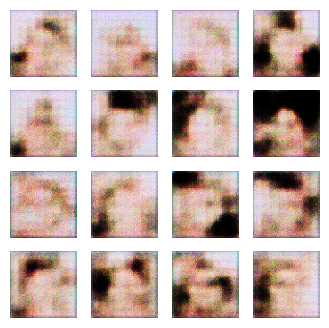

celebGenerated_wgan_0epochs


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Output of the calculating FID command:
FID:  281.519759050974

FID_scores:  [281.519759050974]
81/81 [==============================] - 67s 646ms/step - d_loss: -33.4826 - g_loss: 22.2013
Epoch 2/802
81/81 [==============================] - 11s 138ms/step - d_loss: -16.4203 - g_loss: -8.3287
Epoch 3/802
81/81 [==============================] - 11s 138ms/step - d_loss: -13.7254 - g_loss: -28.2773
Epoch 4/802
81/81 [==============================] - 11s 138ms/step - d_loss: -10.5766 - g_loss: -37.7994
Epoch 5/802
81/81 [==============================] - 11s 138ms/step - d_loss: -10.5865 - g_loss: -57.7715
Epoch 6/802
81/81 [==============================] - 11s 138ms/step - d_loss: -10.5704 - g_loss: -75.5352
Epoch 7/802
81/81 [==============================] - 11s 138ms/step - d_loss: -10.6328 - g_loss: -93.2571
Epoch 8/802
81/81 [==============================] - 11s 138ms/step - d_loss: -10.6511 - g_loss: -114.3647
Epoch 9/802
81/81 [==============================] - 11s 138ms/step - 

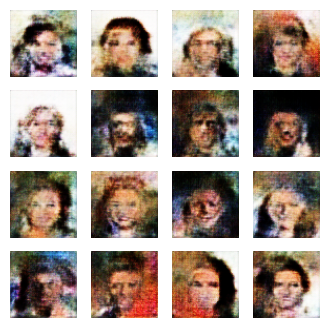

celebGenerated_wgan_10epochs


Output of the calculating FID command:
FID:  244.79483291598387

FID_scores:  [281.519759050974, 244.79483291598387]
81/81 [==============================] - 27s 340ms/step - d_loss: -9.2594 - g_loss: -124.8290
Epoch 12/802
81/81 [==============================] - 11s 138ms/step - d_loss: -8.6804 - g_loss: -111.3460
Epoch 13/802
81/81 [==============================] - 11s 137ms/step - d_loss: -8.0203 - g_loss: -93.7219
Epoch 14/802
81/81 [==============================] - 11s 138ms/step - d_loss: -7.2234 - g_loss: -74.0143
Epoch 15/802
81/81 [==============================] - 11s 138ms/step - d_loss: -6.6876 - g_loss: -51.1517
Epoch 16/802
81/81 [==============================] - 11s 137ms/step - d_loss: -6.4835 - g_loss: -38.3425
Epoch 17/802
81/81 [==============================] - 11s 138ms/step - d_loss: -6.3845 - g_loss: -34.3723
Epoch 18/802
81/81 [==============================] - 11s 138ms/step - d_loss: -6.3731 - g_loss: -32.9199
Epoch 19/802
81/81 [==========================

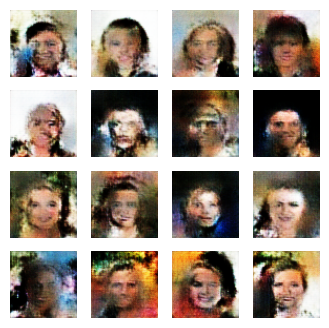

celebGenerated_wgan_20epochs


Output of the calculating FID command:
FID:  152.52397403202963

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963]
81/81 [==============================] - 28s 342ms/step - d_loss: -6.1847 - g_loss: -52.8636
Epoch 22/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.9813 - g_loss: -56.3282
Epoch 23/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.9962 - g_loss: -54.3825
Epoch 24/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.8790 - g_loss: -51.3920
Epoch 25/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.6797 - g_loss: -49.7926
Epoch 26/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.7559 - g_loss: -48.9346
Epoch 27/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.6122 - g_loss: -46.3562
Epoch 28/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.5601 - g_loss: -44.8806
Epoch 29/802
81/81 [========

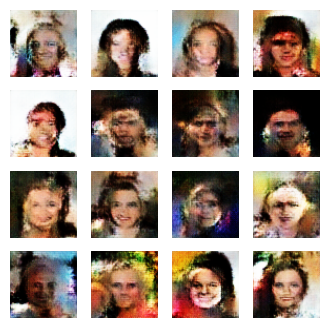

celebGenerated_wgan_30epochs


Output of the calculating FID command:
FID:  116.54509564167415

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415]
81/81 [==============================] - 28s 345ms/step - d_loss: -5.2915 - g_loss: -49.4009
Epoch 32/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.1793 - g_loss: -43.0730
Epoch 33/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.1132 - g_loss: -47.8372
Epoch 34/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.1273 - g_loss: -47.7109
Epoch 35/802
81/81 [==============================] - 11s 138ms/step - d_loss: -5.1136 - g_loss: -46.7308
Epoch 36/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.9403 - g_loss: -45.2163
Epoch 37/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.9993 - g_loss: -44.4444
Epoch 38/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.8622 - g_loss: -44.0279
Epoch 39

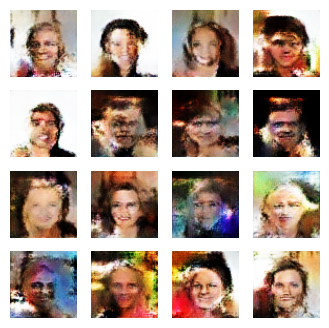

celebGenerated_wgan_40epochs


Output of the calculating FID command:
FID:  106.51685634242997

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997]
81/81 [==============================] - 28s 349ms/step - d_loss: -4.6145 - g_loss: -43.9000
Epoch 42/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.6343 - g_loss: -45.6663
Epoch 43/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.5519 - g_loss: -42.4445
Epoch 44/802
81/81 [==============================] - 11s 137ms/step - d_loss: -4.4578 - g_loss: -36.9694
Epoch 45/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.5063 - g_loss: -34.1567
Epoch 46/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.3380 - g_loss: -34.1640
Epoch 47/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.2818 - g_loss: -35.7721
Epoch 48/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.3212 - g_los

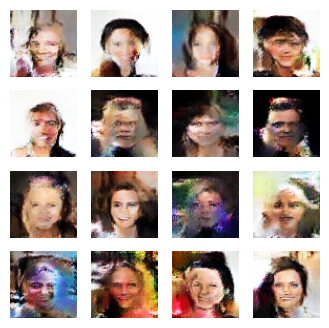

celebGenerated_wgan_50epochs


Output of the calculating FID command:
FID:  85.61406589175817

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817]
81/81 [==============================] - 28s 352ms/step - d_loss: -4.1431 - g_loss: -35.1992
Epoch 52/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.2158 - g_loss: -34.1047
Epoch 53/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.1692 - g_loss: -34.5183
Epoch 54/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.9671 - g_loss: -33.8476
Epoch 55/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.0453 - g_loss: -32.5064
Epoch 56/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.9275 - g_loss: -34.5672
Epoch 57/802
81/81 [==============================] - 11s 138ms/step - d_loss: -4.0210 - g_loss: -33.9656
Epoch 58/802
81/81 [==============================] - 11s 138ms/step - d_los

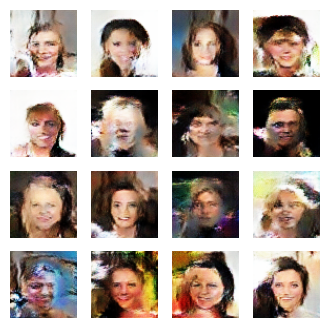

celebGenerated_wgan_60epochs


Output of the calculating FID command:
FID:  67.53540199895576

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576]
81/81 [==============================] - 28s 348ms/step - d_loss: -3.9105 - g_loss: -30.6151
Epoch 62/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.7578 - g_loss: -27.9451
Epoch 63/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.7412 - g_loss: -32.5641
Epoch 64/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.7799 - g_loss: -33.1956
Epoch 65/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.9551 - g_loss: -31.3958
Epoch 66/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.6693 - g_loss: -30.9205
Epoch 67/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.6775 - g_loss: -27.4777
Epoch 68/802
81/81 [==============================] - 11s

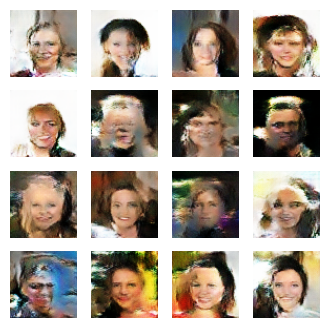

celebGenerated_wgan_70epochs


Output of the calculating FID command:
FID:  61.634147296027805

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805]
81/81 [==============================] - 28s 350ms/step - d_loss: -3.4759 - g_loss: -19.0170
Epoch 72/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.6908 - g_loss: -15.1594
Epoch 73/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.6106 - g_loss: -17.9096
Epoch 74/802
81/81 [==============================] - 11s 137ms/step - d_loss: -3.5458 - g_loss: -20.0583
Epoch 75/802
81/81 [==============================] - 11s 137ms/step - d_loss: -3.2882 - g_loss: -19.5885
Epoch 76/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.3983 - g_loss: -16.4599
Epoch 77/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.4557 - g_loss: -14.2153
Epoch 78/802
81/81 [================

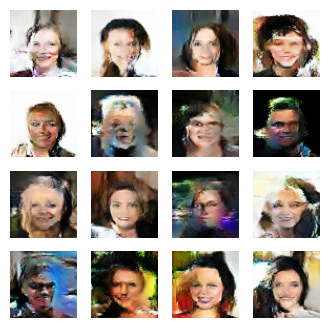

celebGenerated_wgan_80epochs


Output of the calculating FID command:
FID:  59.33863148967498

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498]
81/81 [==============================] - 27s 340ms/step - d_loss: -3.3970 - g_loss: -8.4069
Epoch 82/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.4257 - g_loss: -8.7932
Epoch 83/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.5648 - g_loss: -6.2988
Epoch 84/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.5942 - g_loss: -6.5252
Epoch 85/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.4246 - g_loss: -1.6035
Epoch 86/802
81/81 [==============================] - 11s 137ms/step - d_loss: -3.5426 - g_loss: -7.1157
Epoch 87/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.3717 - g_loss: 0.6828
Epoch 88/802
81/81 [======

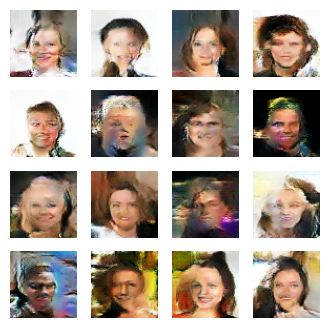

celebGenerated_wgan_90epochs


Output of the calculating FID command:
FID:  52.79945567632154

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154]
81/81 [==============================] - 27s 340ms/step - d_loss: -3.2178 - g_loss: -4.7820
Epoch 92/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.1258 - g_loss: -1.3014
Epoch 93/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.4515 - g_loss: -1.2600
Epoch 94/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.3644 - g_loss: -1.2265
Epoch 95/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.2173 - g_loss: -0.7818
Epoch 96/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.3552 - g_loss: -1.3739
Epoch 97/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.3997 - g_loss: -0.5419
Epoch 

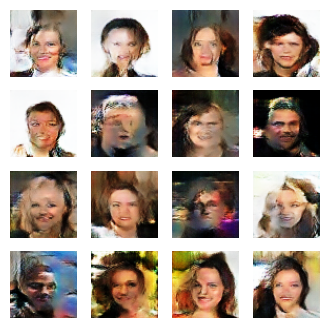

celebGenerated_wgan_100epochs


Output of the calculating FID command:
FID:  49.39114550913678

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551]


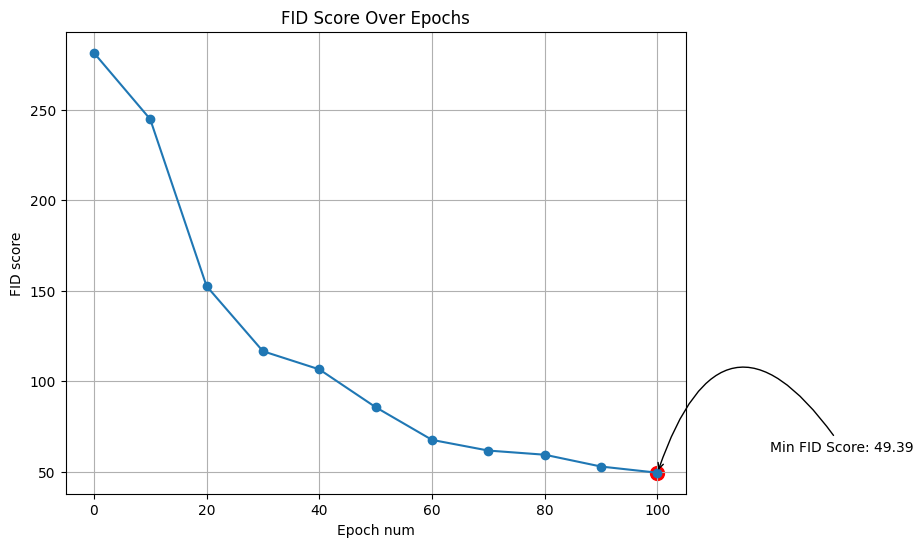

81/81 [==============================] - 28s 343ms/step - d_loss: -3.1163 - g_loss: -1.4361
Epoch 102/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.2521 - g_loss: -0.6804
Epoch 103/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.0567 - g_loss: 0.7390
Epoch 104/802
81/81 [==============================] - 11s 137ms/step - d_loss: -3.0286 - g_loss: 0.9394
Epoch 105/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.2088 - g_loss: 3.1531
Epoch 106/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.1727 - g_loss: 5.2486
Epoch 107/802
81/81 [==============================] - 11s 137ms/step - d_loss: -2.9739 - g_loss: 1.4234
Epoch 108/802
81/81 [==============================] - 11s 137ms/step - d_loss: -3.0772 - g_loss: 0.0384
Epoch 109/802
81/81 [==============================] - 11s 137ms/step - d_loss: -3.2773 - g_loss: 5.4514
Epoch 110/802
81/81 [==============================] - 11s 138ms/st

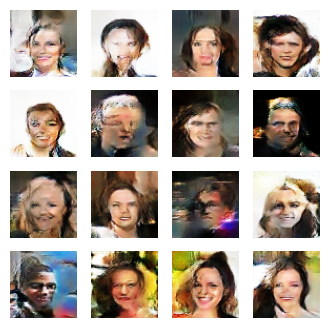

celebGenerated_wgan_110epochs


Output of the calculating FID command:
FID:  46.185322442703296

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244]


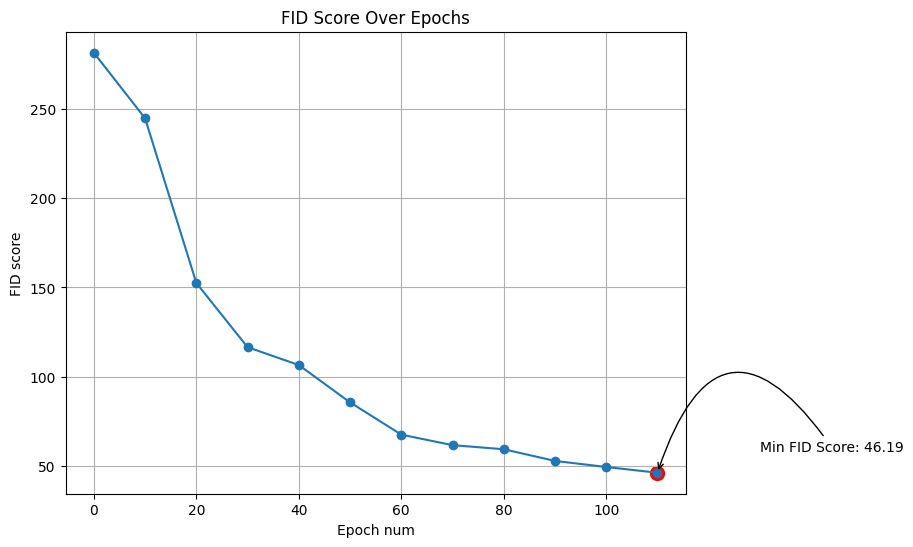

81/81 [==============================] - 28s 345ms/step - d_loss: -2.9825 - g_loss: 10.8215
Epoch 112/802
81/81 [==============================] - 11s 138ms/step - d_loss: -3.0077 - g_loss: 6.2029
Epoch 113/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8691 - g_loss: 5.8851
Epoch 114/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8250 - g_loss: 10.6092
Epoch 115/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.9142 - g_loss: 10.1230
Epoch 116/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.9680 - g_loss: 7.9768
Epoch 117/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.9560 - g_loss: 9.4792
Epoch 118/802
81/81 [==============================] - 11s 137ms/step - d_loss: -2.9665 - g_loss: 7.1238
Epoch 119/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8689 - g_loss: 2.0928
Epoch 120/802
81/81 [==============================] - 11s 137ms/s

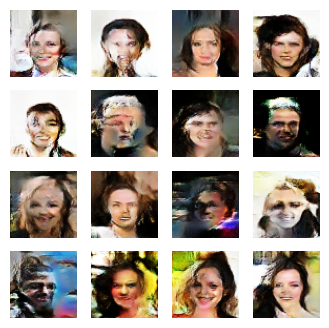

celebGenerated_wgan_120epochs


Output of the calculating FID command:
FID:  49.99769057000978

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057]


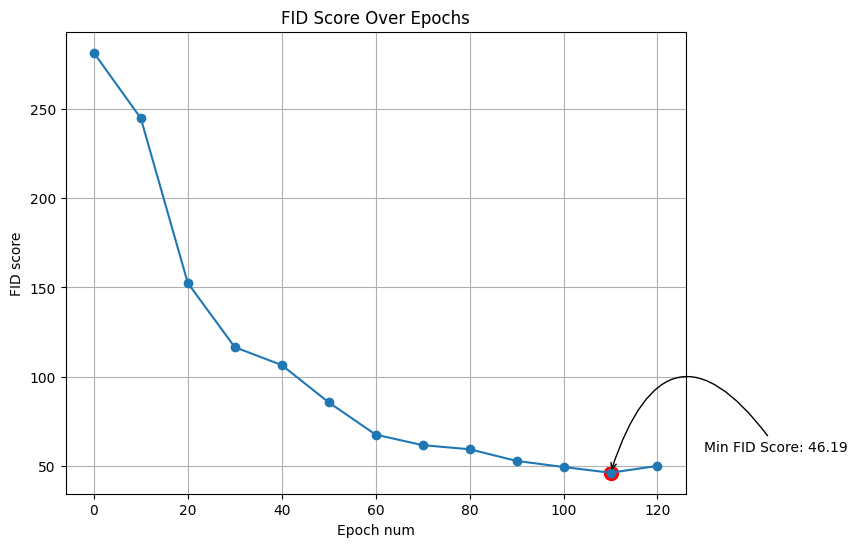

81/81 [==============================] - 28s 346ms/step - d_loss: -2.7525 - g_loss: 7.5194
Epoch 122/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8491 - g_loss: 13.5900
Epoch 123/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.9307 - g_loss: 13.0241
Epoch 124/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7497 - g_loss: 8.8918
Epoch 125/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8261 - g_loss: -0.3026
Epoch 126/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7385 - g_loss: 3.1719
Epoch 127/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7391 - g_loss: 9.4442
Epoch 128/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8037 - g_loss: 6.2520
Epoch 129/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7840 - g_loss: 8.3350
Epoch 130/802
81/81 [==============================] - 11s 138ms/s

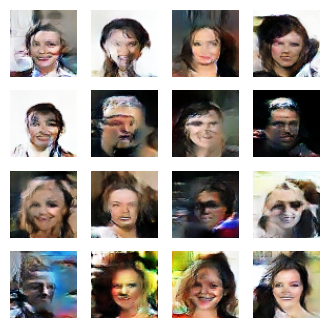

celebGenerated_wgan_130epochs


Output of the calculating FID command:
FID:  49.50717169910604

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717 ]


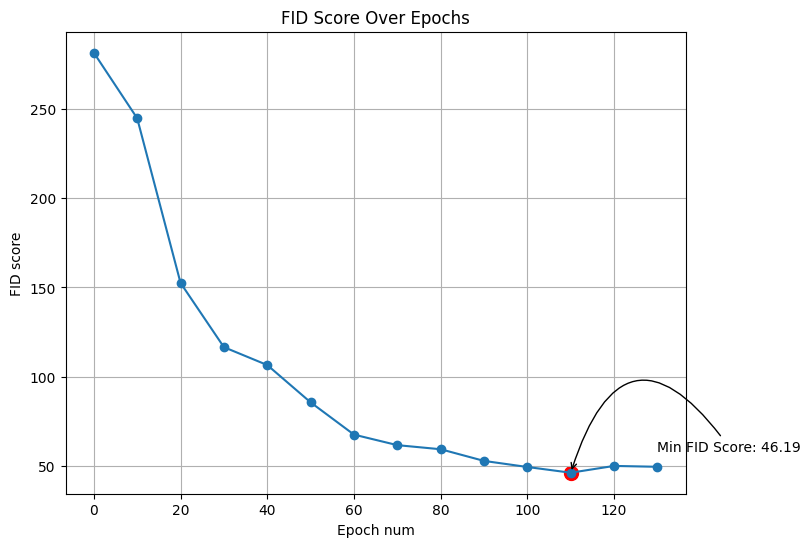

81/81 [==============================] - 28s 348ms/step - d_loss: -2.7151 - g_loss: 7.7756
Epoch 132/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.6645 - g_loss: 8.5740
Epoch 133/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7071 - g_loss: 13.1520
Epoch 134/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7117 - g_loss: 12.7118
Epoch 135/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.5814 - g_loss: 18.9782
Epoch 136/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.7010 - g_loss: 16.1231
Epoch 137/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.6413 - g_loss: 13.1157
Epoch 138/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.5300 - g_loss: 12.9712
Epoch 139/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4395 - g_loss: 16.4414
Epoch 140/802
81/81 [==============================] - 11s 138

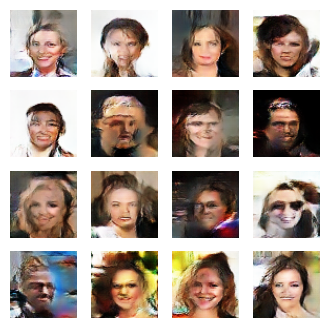

celebGenerated_wgan_140epochs


Output of the calculating FID command:
FID:  38.12733264872793

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265]


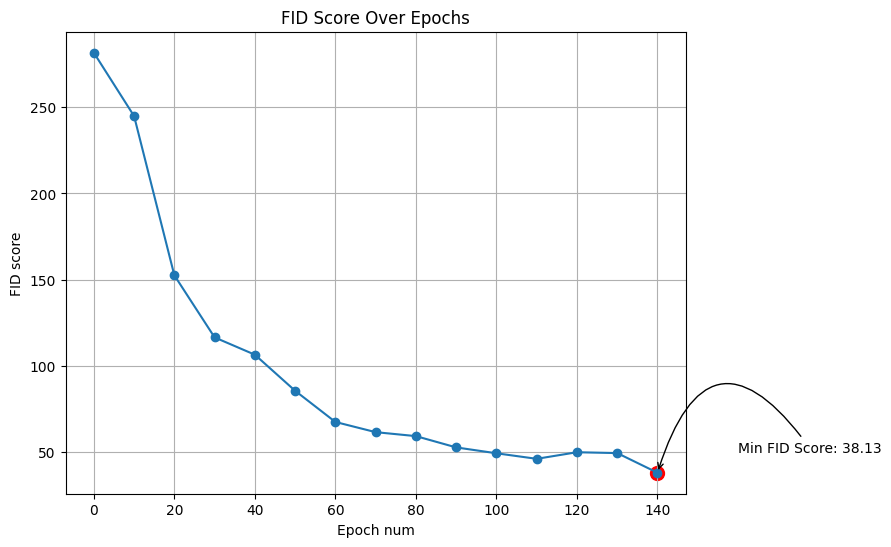

81/81 [==============================] - 29s 358ms/step - d_loss: -2.6216 - g_loss: 14.8060
Epoch 142/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.5030 - g_loss: 16.7413
Epoch 143/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.6657 - g_loss: 13.8148
Epoch 144/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.5990 - g_loss: 11.7600
Epoch 145/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4669 - g_loss: 9.8966
Epoch 146/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.6666 - g_loss: 14.3152
Epoch 147/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.6055 - g_loss: 13.7829
Epoch 148/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4650 - g_loss: 12.1237
Epoch 149/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.5998 - g_loss: 6.0556
Epoch 150/802
81/81 [==============================] - 11s 138

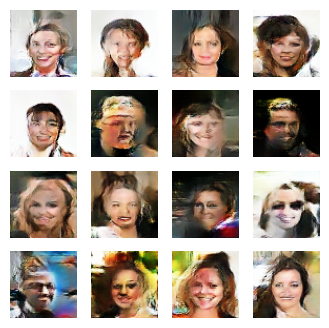

celebGenerated_wgan_150epochs


Output of the calculating FID command:
FID:  38.696157739230614

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774]


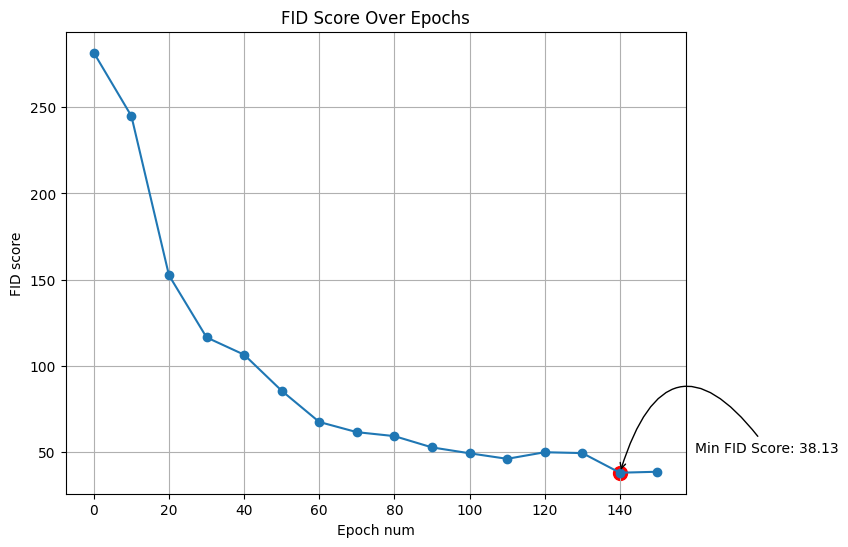

81/81 [==============================] - 29s 362ms/step - d_loss: -2.5190 - g_loss: 10.4236
Epoch 152/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4470 - g_loss: 13.8743
Epoch 153/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4320 - g_loss: 16.4204
Epoch 154/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.6082 - g_loss: 14.5710
Epoch 155/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4632 - g_loss: 17.4892
Epoch 156/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.3844 - g_loss: 13.0904
Epoch 157/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4588 - g_loss: 15.3608
Epoch 158/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4701 - g_loss: 15.5426
Epoch 159/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4383 - g_loss: 16.4799
Epoch 160/802
81/81 [==============================] - 11s 1

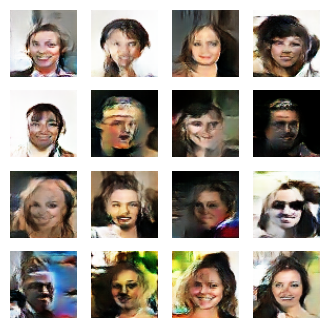

celebGenerated_wgan_160epochs


Output of the calculating FID command:
FID:  41.653033919262384

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392]


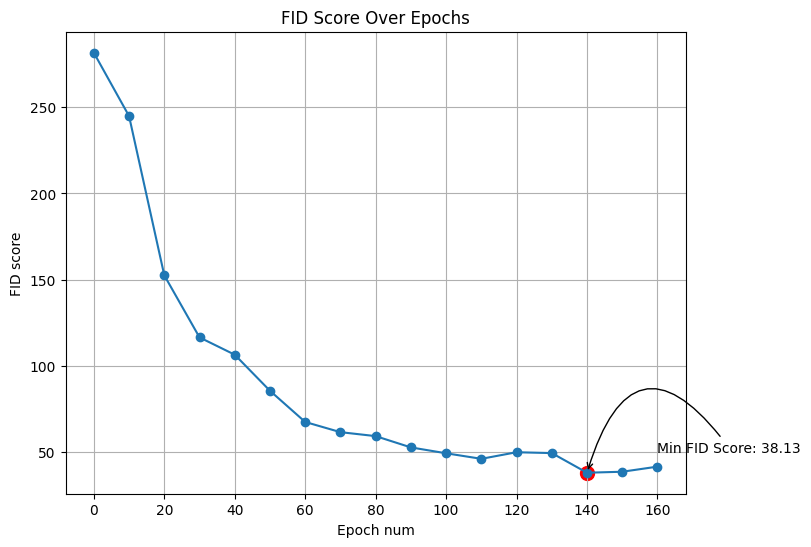

81/81 [==============================] - 29s 354ms/step - d_loss: -2.3364 - g_loss: 14.6067
Epoch 162/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4251 - g_loss: 16.5397
Epoch 163/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2633 - g_loss: 15.8741
Epoch 164/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2459 - g_loss: 11.6652
Epoch 165/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4105 - g_loss: 12.3920
Epoch 166/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1814 - g_loss: 18.2348
Epoch 167/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2998 - g_loss: 17.9694
Epoch 168/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2204 - g_loss: 18.5112
Epoch 169/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2552 - g_loss: 14.8846
Epoch 170/802
81/81 [==============================] - 11s 1

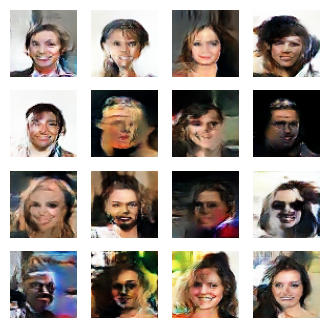

celebGenerated_wgan_170epochs


Output of the calculating FID command:
FID:  37.33476185343574

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185]


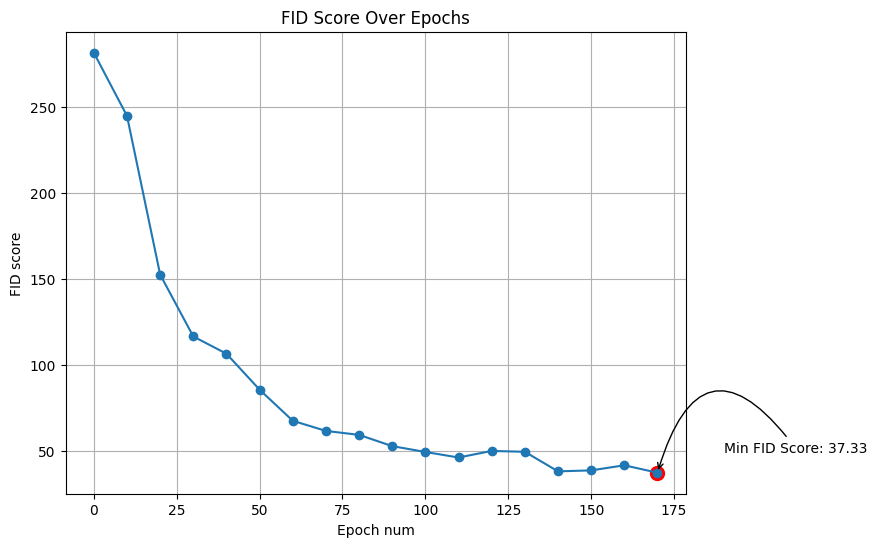

81/81 [==============================] - 28s 348ms/step - d_loss: -2.3135 - g_loss: 11.4242
Epoch 172/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.3476 - g_loss: 9.4104
Epoch 173/802
81/81 [==============================] - 11s 137ms/step - d_loss: -2.2073 - g_loss: 18.0511
Epoch 174/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1495 - g_loss: 18.2954
Epoch 175/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2441 - g_loss: 19.9475
Epoch 176/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2574 - g_loss: 15.8643
Epoch 177/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2041 - g_loss: 13.7288
Epoch 178/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1866 - g_loss: 13.3161
Epoch 179/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.3503 - g_loss: 11.8777
Epoch 180/802
81/81 [==============================] - 11s 13

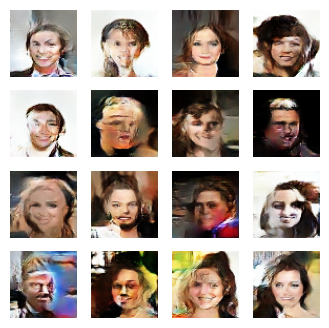

celebGenerated_wgan_180epochs


Output of the calculating FID command:
FID:  37.87409309431624

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309]


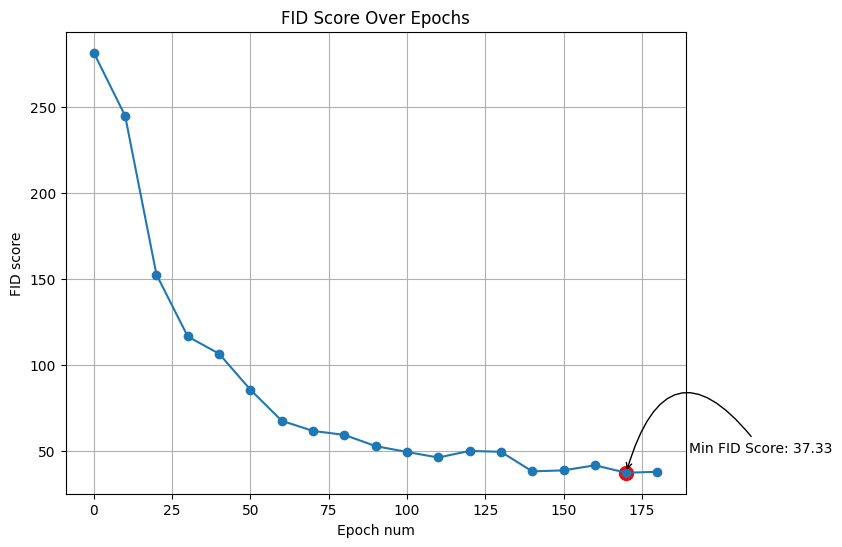

81/81 [==============================] - 28s 342ms/step - d_loss: -2.1461 - g_loss: 13.8403
Epoch 182/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0617 - g_loss: 15.8187
Epoch 183/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0923 - g_loss: 12.5458
Epoch 184/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2178 - g_loss: 14.2994
Epoch 185/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1421 - g_loss: 9.8739
Epoch 186/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2991 - g_loss: 13.9842
Epoch 187/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1612 - g_loss: 10.4449
Epoch 188/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1742 - g_loss: 11.0324
Epoch 189/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0101 - g_loss: 17.2300
Epoch 190/802
81/81 [==============================] - 11s 13

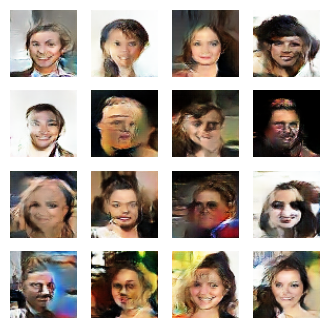

celebGenerated_wgan_190epochs


Output of the calculating FID command:
FID:  37.0216709322944

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093]


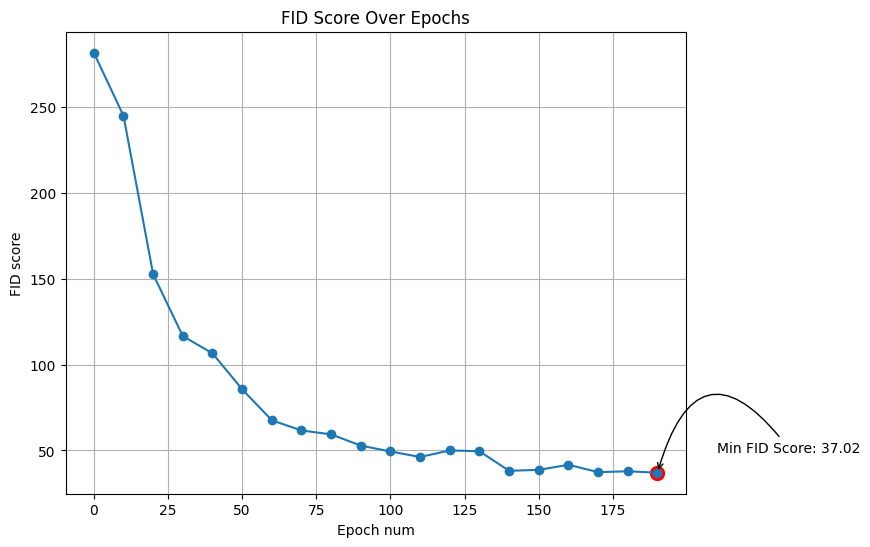

81/81 [==============================] - 28s 353ms/step - d_loss: -2.1628 - g_loss: 13.8611
Epoch 192/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0919 - g_loss: 11.4476
Epoch 193/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9778 - g_loss: 13.3156
Epoch 194/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1475 - g_loss: 10.3548
Epoch 195/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0473 - g_loss: 6.8236
Epoch 196/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0140 - g_loss: 10.1929
Epoch 197/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0358 - g_loss: 6.4680
Epoch 198/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0390 - g_loss: 6.8977
Epoch 199/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1377 - g_loss: 9.3134
Epoch 200/802
81/81 [==============================] - 11s 138ms

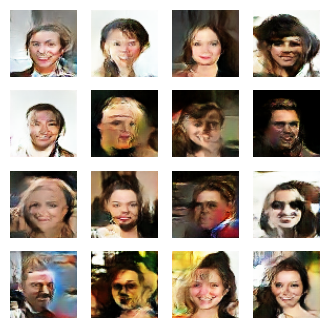

celebGenerated_wgan_200epochs


Output of the calculating FID command:
FID:  36.892405782868565

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578]


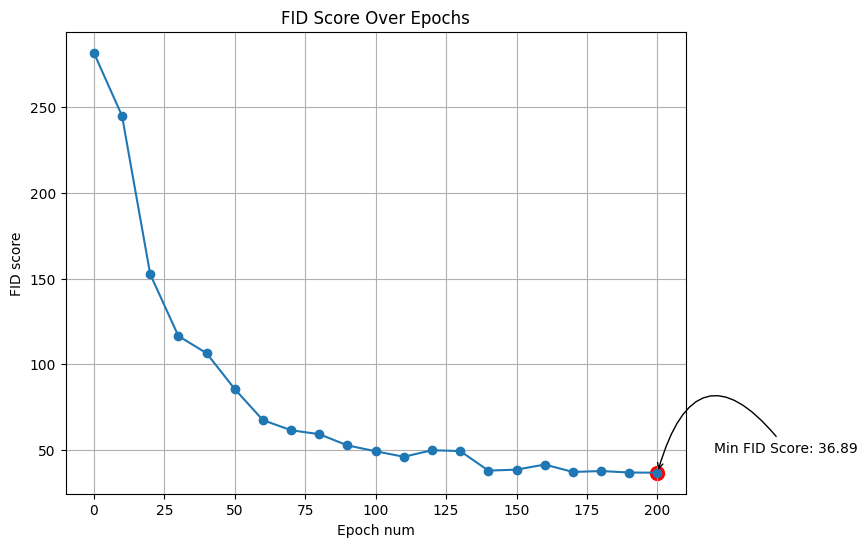

81/81 [==============================] - 28s 343ms/step - d_loss: -2.0329 - g_loss: 13.8023
Epoch 202/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1091 - g_loss: 10.6981
Epoch 203/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0780 - g_loss: 12.0720
Epoch 204/802
81/81 [==============================] - 11s 137ms/step - d_loss: -2.1230 - g_loss: 7.7340
Epoch 205/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0623 - g_loss: 12.1066
Epoch 206/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1043 - g_loss: 14.8707
Epoch 207/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1751 - g_loss: 8.2019
Epoch 208/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9078 - g_loss: 9.7713
Epoch 209/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0739 - g_loss: 8.9090
Epoch 210/802
81/81 [==============================] - 11s 138ms

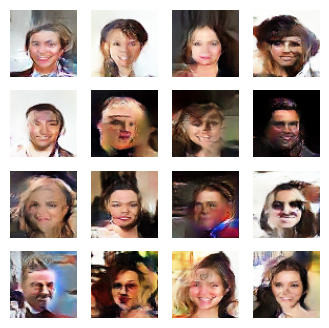

celebGenerated_wgan_210epochs


Output of the calculating FID command:
FID:  33.48703159432284

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159]


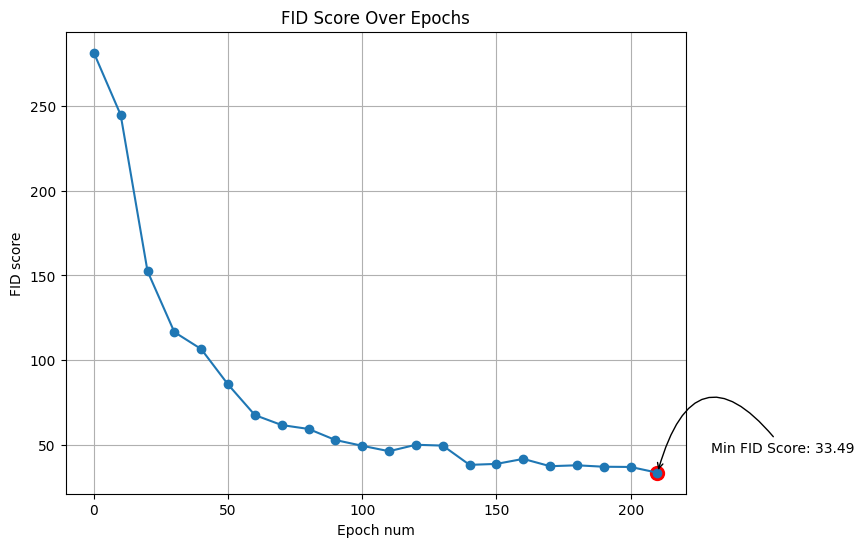

81/81 [==============================] - 28s 343ms/step - d_loss: -1.9938 - g_loss: 4.7364
Epoch 212/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0219 - g_loss: 7.1841
Epoch 213/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0578 - g_loss: 10.7272
Epoch 214/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0481 - g_loss: 14.7587
Epoch 215/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.9296 - g_loss: 4.8377
Epoch 216/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1490 - g_loss: 1.9237
Epoch 217/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9201 - g_loss: 1.7213
Epoch 218/802
81/81 [==============================] - 11s 137ms/step - d_loss: -2.0421 - g_loss: 7.8097
Epoch 219/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9546 - g_loss: 6.7256
Epoch 220/802
81/81 [==============================] - 11s 138ms/st

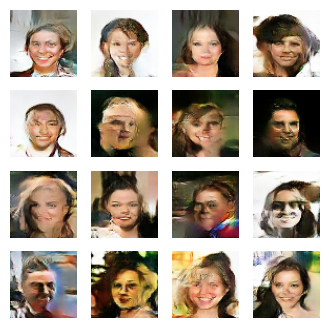

celebGenerated_wgan_220epochs


Output of the calculating FID command:
FID:  35.60786138870776

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139]


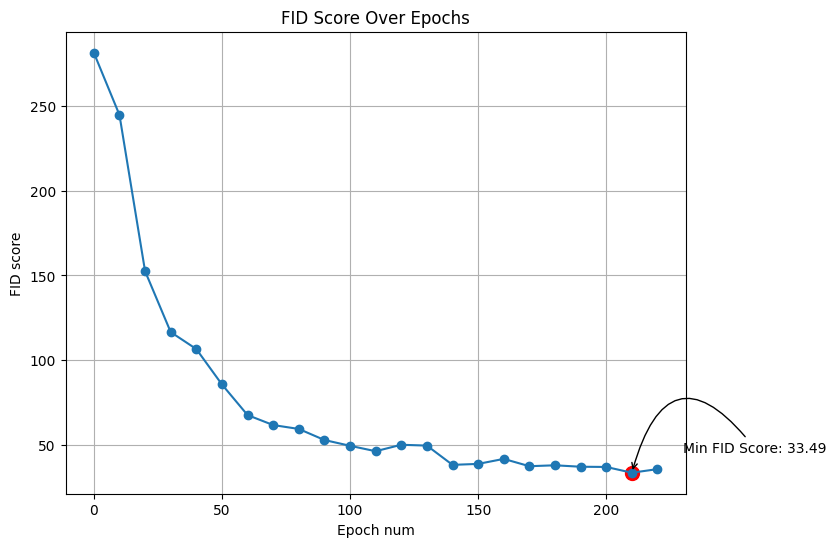

81/81 [==============================] - 28s 344ms/step - d_loss: -1.9852 - g_loss: -0.8609
Epoch 222/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8889 - g_loss: -3.8728
Epoch 223/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9197 - g_loss: -0.4711
Epoch 224/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9843 - g_loss: 6.9017
Epoch 225/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.9606 - g_loss: 4.0772
Epoch 226/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8904 - g_loss: 10.3480
Epoch 227/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8604 - g_loss: 8.5120
Epoch 228/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.8910 - g_loss: 11.3519
Epoch 229/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.9581 - g_loss: 7.8913
Epoch 230/802
81/81 [==============================] - 11s 138ms

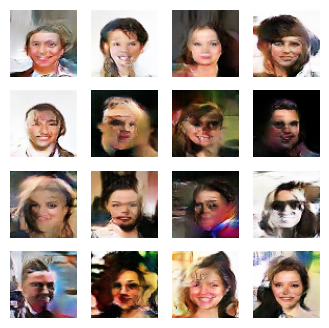

celebGenerated_wgan_230epochs


Output of the calculating FID command:
FID:  35.12983946549525

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947]


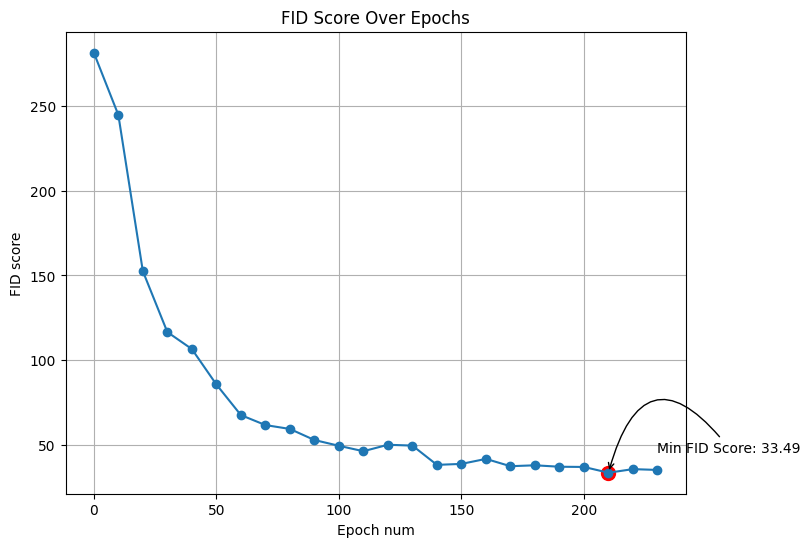

81/81 [==============================] - 29s 359ms/step - d_loss: -1.8463 - g_loss: 16.0446
Epoch 232/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9010 - g_loss: 11.7852
Epoch 233/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0141 - g_loss: 9.7235
Epoch 234/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9581 - g_loss: 9.6002
Epoch 235/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.8495 - g_loss: -2.6431
Epoch 236/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8215 - g_loss: 6.3543
Epoch 237/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8627 - g_loss: 4.2515
Epoch 238/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7591 - g_loss: 10.2120
Epoch 239/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7540 - g_loss: 15.4173
Epoch 240/802
81/81 [==============================] - 11s 138ms

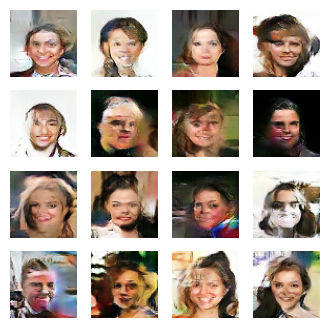

celebGenerated_wgan_240epochs


Output of the calculating FID command:
FID:  35.12568601276712

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.12568601]


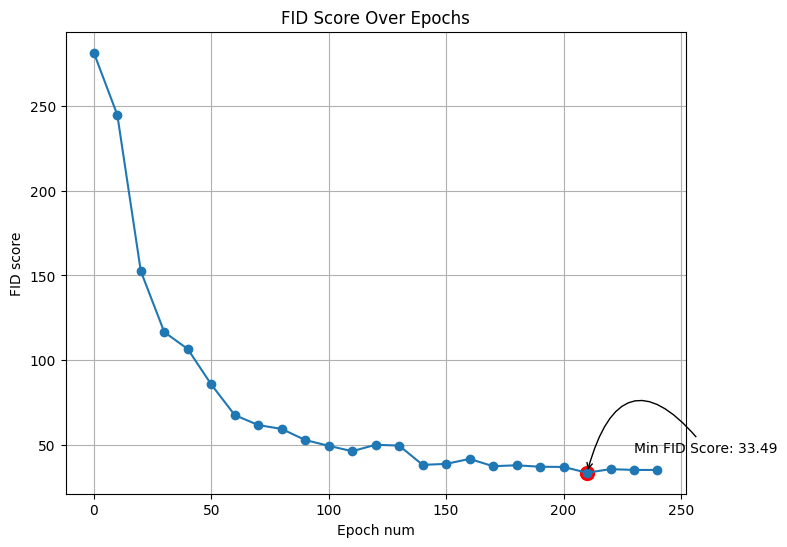

81/81 [==============================] - 29s 363ms/step - d_loss: -1.7693 - g_loss: 3.6068
Epoch 242/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6541 - g_loss: 15.7781
Epoch 243/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9973 - g_loss: 10.3163
Epoch 244/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6089 - g_loss: 4.3157
Epoch 245/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9931 - g_loss: 11.4058
Epoch 246/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.9076 - g_loss: 11.4375
Epoch 247/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6382 - g_loss: 15.8012
Epoch 248/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7724 - g_loss: 11.9417
Epoch 249/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9344 - g_loss: 18.8697
Epoch 250/802
81/81 [==============================] - 11s 138

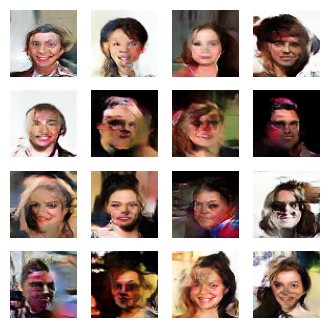

celebGenerated_wgan_250epochs


Output of the calculating FID command:
FID:  35.41333242080054

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.12568601
  35.41333242]


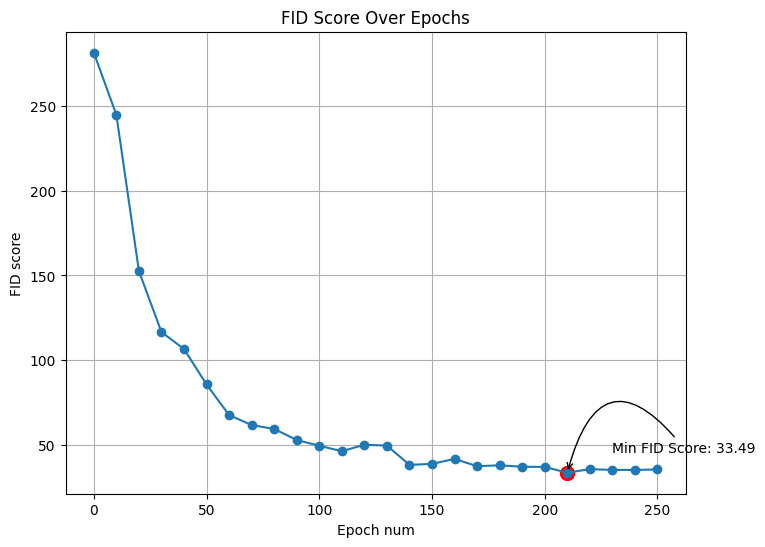

81/81 [==============================] - 28s 346ms/step - d_loss: -1.7622 - g_loss: -10.1400
Epoch 252/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9215 - g_loss: 5.5310
Epoch 253/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8353 - g_loss: 13.1405
Epoch 254/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7155 - g_loss: 16.6123
Epoch 255/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7540 - g_loss: 17.0213
Epoch 256/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8183 - g_loss: 8.1214
Epoch 257/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6811 - g_loss: 17.2290
Epoch 258/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8344 - g_loss: 17.5275
Epoch 259/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.6104 - g_loss: 1.7262
Epoch 260/802
81/81 [==============================] - 11s 138

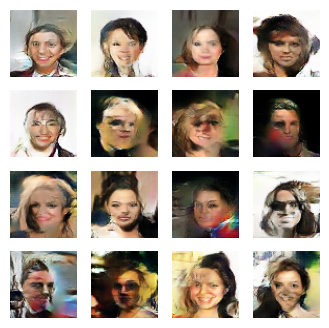

celebGenerated_wgan_260epochs


Output of the calculating FID command:
FID:  38.024755052099295

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.12568601
  35.41333242  38.02475505]


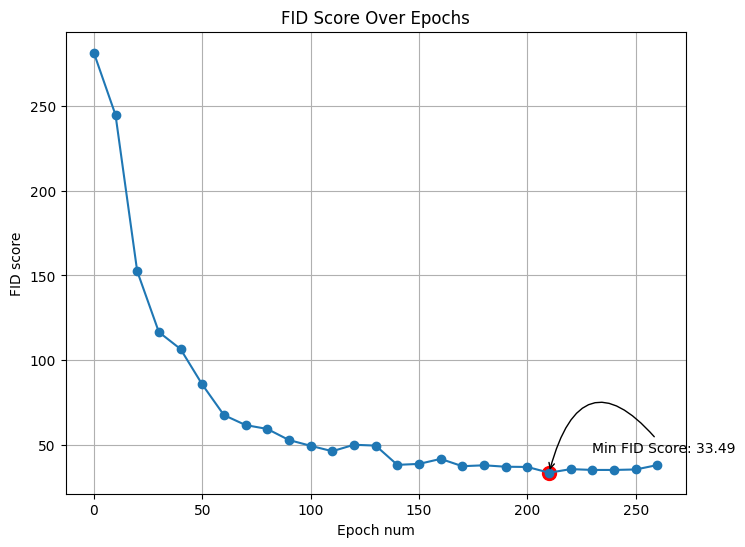

81/81 [==============================] - 28s 345ms/step - d_loss: -1.6108 - g_loss: 10.3682
Epoch 262/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4555 - g_loss: -5.1538
Epoch 263/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7175 - g_loss: -14.9655
Epoch 264/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5326 - g_loss: -4.1141
Epoch 265/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5162 - g_loss: 5.2279
Epoch 266/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7949 - g_loss: -7.7467
Epoch 267/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7493 - g_loss: -9.8100
Epoch 268/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5338 - g_loss: -17.2278
Epoch 269/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6439 - g_loss: -0.4020
Epoch 270/802
81/81 [==============================] - 11s 

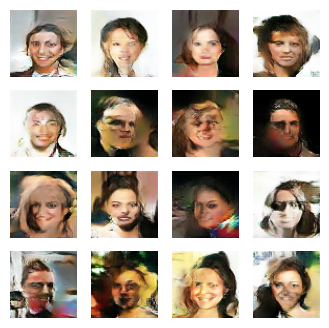

celebGenerated_wgan_270epochs


Output of the calculating FID command:
FID:  40.16103232281256

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.12568601
  35.41333242  38.02475505  40.16103232]


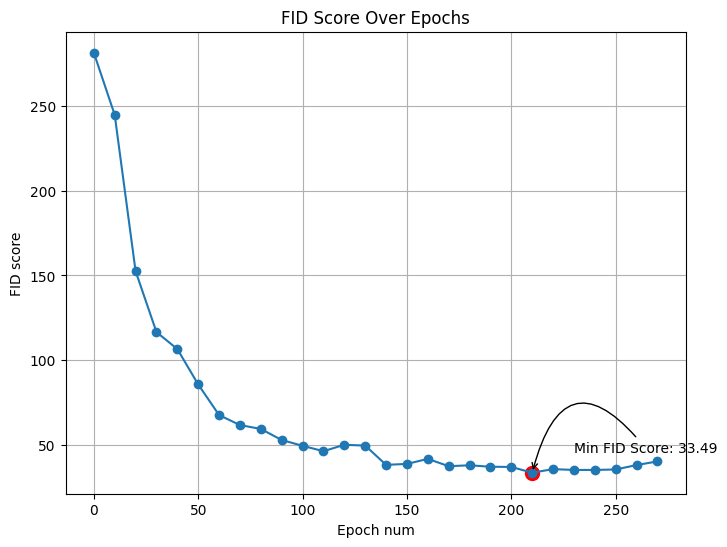

81/81 [==============================] - 28s 342ms/step - d_loss: -2.0691 - g_loss: 9.8805
Epoch 272/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2093 - g_loss: -12.3950
Epoch 273/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3080 - g_loss: 13.3816
Epoch 274/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5287 - g_loss: -8.8252
Epoch 275/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.4549 - g_loss: 16.3700
Epoch 276/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.3585 - g_loss: 5.9331
Epoch 277/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5892 - g_loss: 1.5300
Epoch 278/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6251 - g_loss: -11.7142
Epoch 279/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7966 - g_loss: -40.4619
Epoch 280/802
81/81 [==============================] - 11s 1

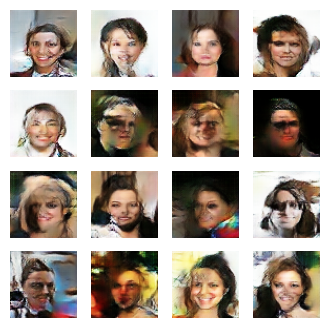

celebGenerated_wgan_280epochs


Output of the calculating FID command:
FID:  40.75251315893456

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.12568601
  35.41333242  38.02475505  40.16

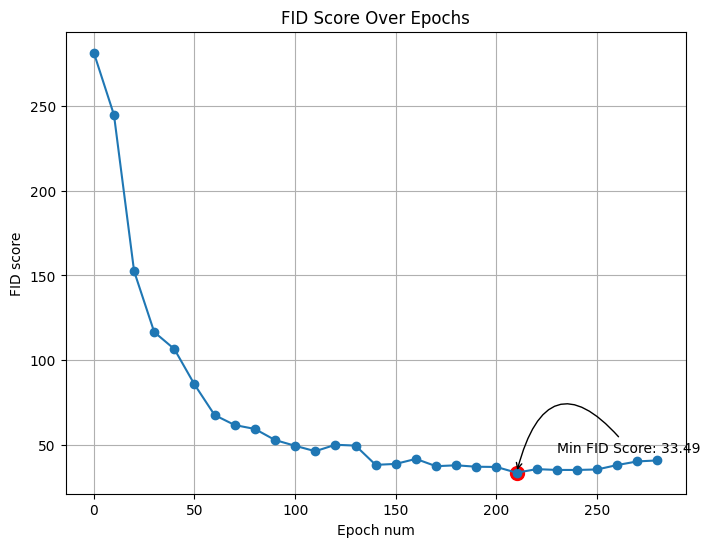

81/81 [==============================] - 28s 346ms/step - d_loss: -1.4105 - g_loss: -14.2476
Epoch 282/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3184 - g_loss: -13.0125
Epoch 283/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5129 - g_loss: -54.2403
Epoch 284/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.1237 - g_loss: -29.5731
Epoch 285/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3409 - g_loss: -29.0614
Epoch 286/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.5808 - g_loss: -39.7464
Epoch 287/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5627 - g_loss: -24.5394
Epoch 288/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7852 - g_loss: 23.7261
Epoch 289/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4805 - g_loss: -33.3387
Epoch 290/802
81/81 [==============================]

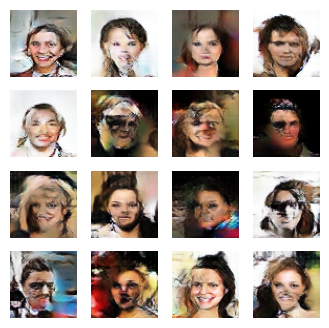

celebGenerated_wgan_290epochs


Output of the calculating FID command:
FID:  51.966815109714645

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.12568601
  35.4133324

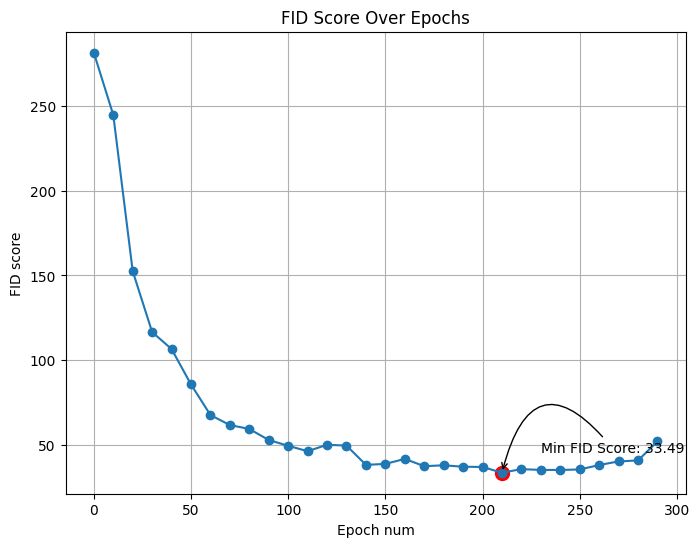

81/81 [==============================] - 28s 350ms/step - d_loss: -1.6873 - g_loss: -37.7481
Epoch 292/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0680 - g_loss: 29.7330
Epoch 293/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2947 - g_loss: 11.0536
Epoch 294/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.4376 - g_loss: -12.8989
Epoch 295/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7711 - g_loss: -35.6312
Epoch 296/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3697 - g_loss: -38.7793
Epoch 297/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3255 - g_loss: -73.1464
Epoch 298/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.9499 - g_loss: -29.2210
Epoch 299/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4020 - g_loss: -91.8759
Epoch 300/802
81/81 [==============================] 

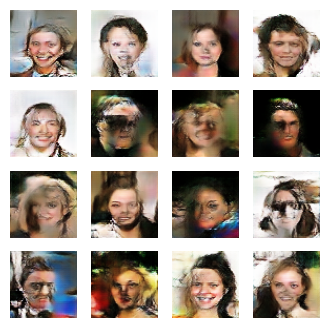

celebGenerated_wgan_300epochs


Output of the calculating FID command:
FID:  45.174283919420105

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139  35.12983947  35.1

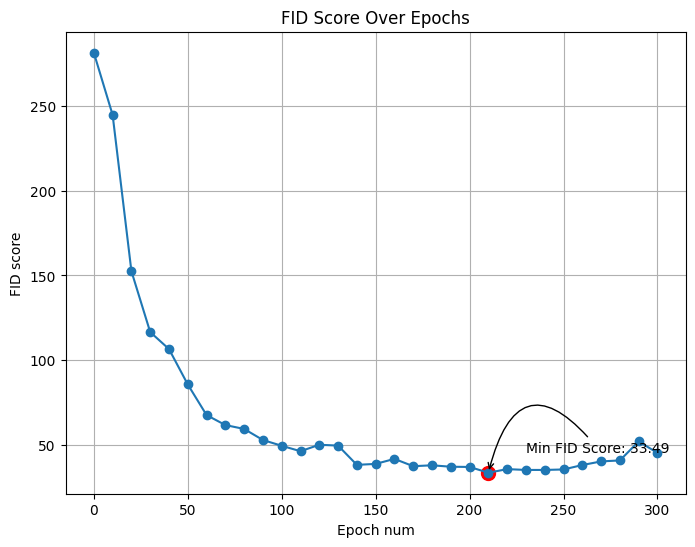

81/81 [==============================] - 28s 350ms/step - d_loss: -1.4923 - g_loss: -104.4138
Epoch 302/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3330 - g_loss: -30.4069
Epoch 303/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0888 - g_loss: 5.0697
Epoch 304/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8512 - g_loss: -58.9384
Epoch 305/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.8003 - g_loss: -35.2647
Epoch 306/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4837 - g_loss: -37.5891
Epoch 307/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4530 - g_loss: 55.7508
Epoch 308/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.5464 - g_loss: 48.9441
Epoch 309/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6395 - g_loss: -68.0336
Epoch 310/802
81/81 [==============================] -

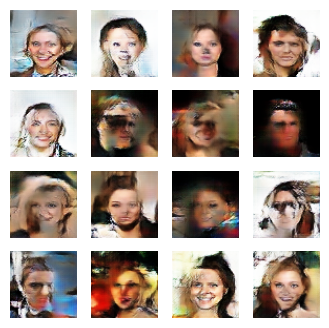

celebGenerated_wgan_310epochs


Output of the calculating FID command:
FID:  50.80379120422165

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.48703159  35.60786139 

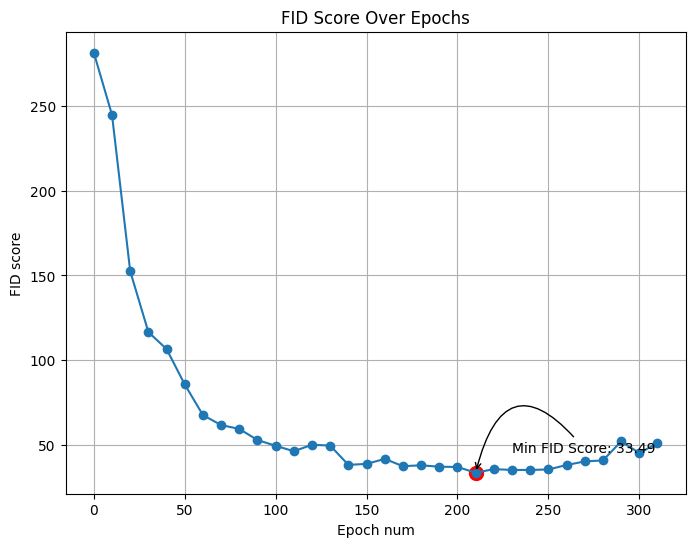

81/81 [==============================] - 28s 353ms/step - d_loss: -1.0830 - g_loss: -119.5313
Epoch 312/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.7841 - g_loss: -105.2432
Epoch 313/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.8513 - g_loss: 22.7267
Epoch 314/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8224 - g_loss: -17.2079
Epoch 315/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9479 - g_loss: -90.4532
Epoch 316/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6074 - g_loss: -146.8588
Epoch 317/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.1537 - g_loss: -5.6611
Epoch 318/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8109 - g_loss: 38.8835
Epoch 319/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.2281 - g_loss: -24.4746
Epoch 320/802
81/81 [==============================

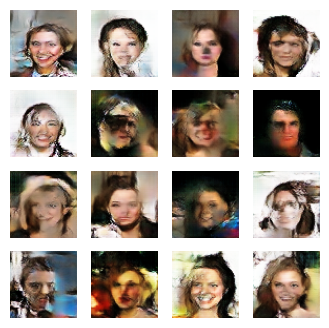

celebGenerated_wgan_320epochs


Output of the calculating FID command:
FID:  50.44784300207408

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  36.89240578  33.487

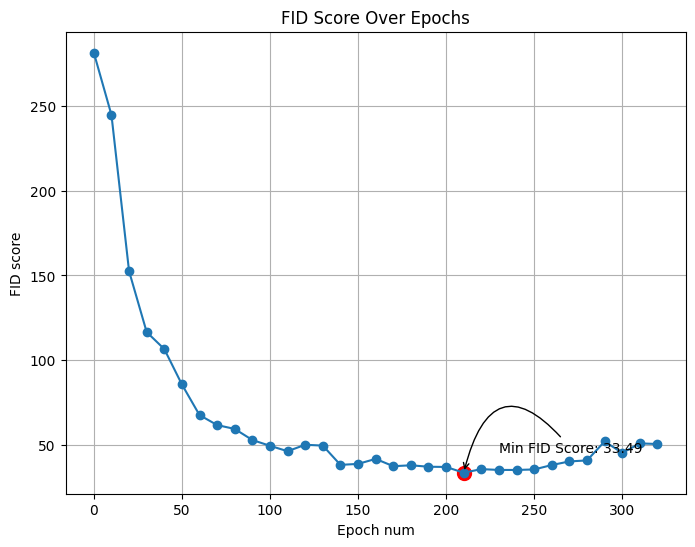

81/81 [==============================] - 28s 348ms/step - d_loss: -1.5899 - g_loss: -93.1127
Epoch 322/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5377 - g_loss: -67.1428
Epoch 323/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0070 - g_loss: 3.3373
Epoch 324/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3583 - g_loss: 72.6998
Epoch 325/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3364 - g_loss: 111.0904
Epoch 326/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3630 - g_loss: 54.9926
Epoch 327/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.5327 - g_loss: -30.2728
Epoch 328/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2455 - g_loss: -65.4407
Epoch 329/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8342 - g_loss: -59.6881
Epoch 330/802
81/81 [==============================] - 

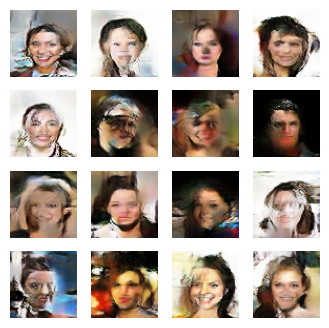

celebGenerated_wgan_330epochs


Output of the calculating FID command:
FID:  51.93379731036137

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409309  37.02167093
  

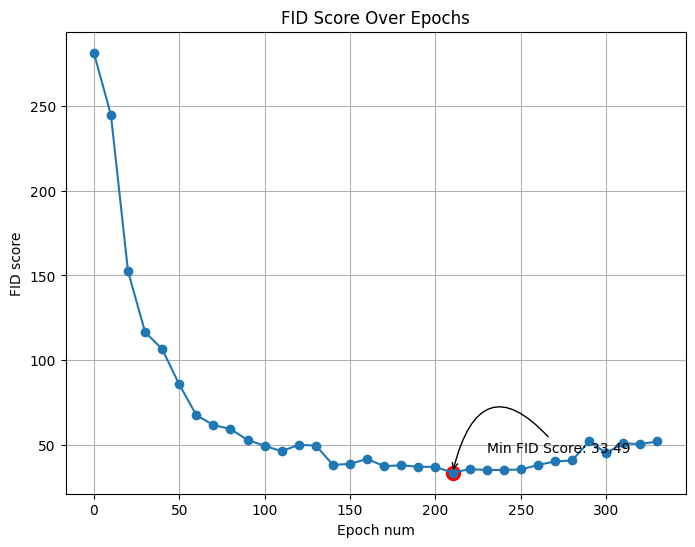

81/81 [==============================] - 28s 342ms/step - d_loss: -1.3461 - g_loss: -10.3891
Epoch 332/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5946 - g_loss: 42.8376
Epoch 333/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3269 - g_loss: 29.3009
Epoch 334/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5204 - g_loss: -52.5231
Epoch 335/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7747 - g_loss: -132.0066
Epoch 336/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8676 - g_loss: -132.8343
Epoch 337/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7214 - g_loss: -76.7043
Epoch 338/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3824 - g_loss: -166.6935
Epoch 339/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3383 - g_loss: -103.7995
Epoch 340/802
81/81 [============================

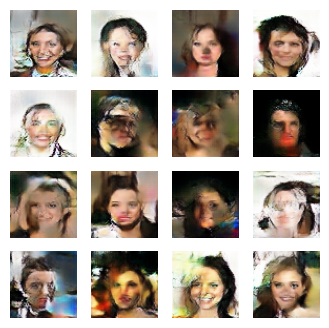

celebGenerated_wgan_340epochs


Output of the calculating FID command:
FID:  54.39313804519932

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  37.33476185  37.87409

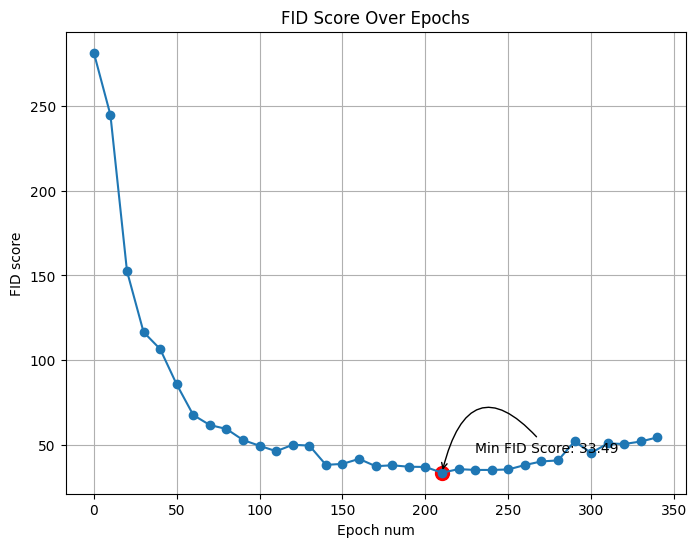

81/81 [==============================] - 28s 343ms/step - d_loss: -1.3053 - g_loss: -114.0650
Epoch 342/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0729 - g_loss: -107.9450
Epoch 343/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0678 - g_loss: -98.2432
Epoch 344/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7412 - g_loss: -11.9405
Epoch 345/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9551 - g_loss: 101.7624
Epoch 346/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0357 - g_loss: 103.5978
Epoch 347/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7484 - g_loss: 111.5187
Epoch 348/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6708 - g_loss: 84.4833
Epoch 349/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5621 - g_loss: 56.2444
Epoch 350/802
81/81 [==============================

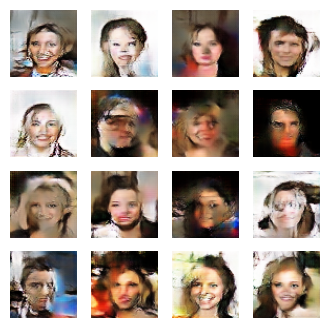

celebGenerated_wgan_350epochs


Output of the calculating FID command:
FID:  52.831299448512624

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615774  41.65303392  

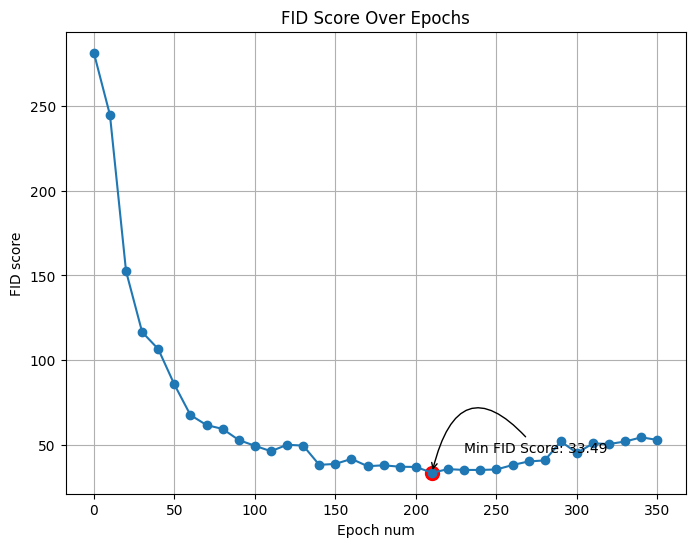

81/81 [==============================] - 29s 355ms/step - d_loss: -1.9848 - g_loss: -62.6722
Epoch 352/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.8812 - g_loss: -28.0555
Epoch 353/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.0444 - g_loss: -16.8913
Epoch 354/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5540 - g_loss: 7.1173
Epoch 355/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.6000 - g_loss: 97.9009
Epoch 356/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0746 - g_loss: -7.0908
Epoch 357/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2542 - g_loss: -138.8133
Epoch 358/802
81/81 [==============================] - 11s 137ms/step - d_loss: -0.8765 - g_loss: -170.6430
Epoch 359/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9419 - g_loss: -145.7809
Epoch 360/802
81/81 [==============================]

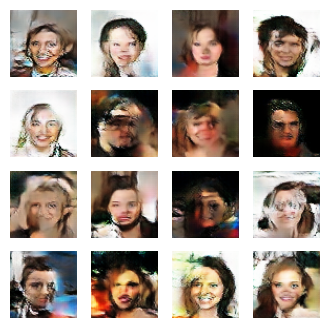

celebGenerated_wgan_360epochs


Output of the calculating FID command:
FID:  53.81554942431114

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.12733265
  38.69615

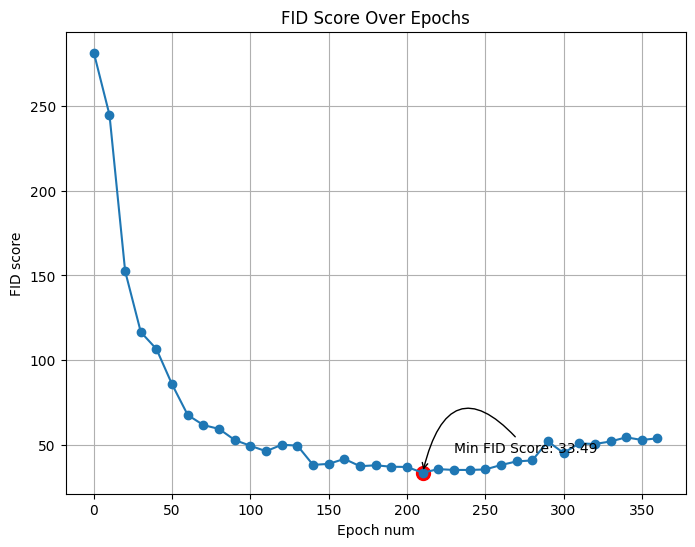

81/81 [==============================] - 29s 358ms/step - d_loss: -1.0370 - g_loss: -62.2348
Epoch 362/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4314 - g_loss: -75.8931
Epoch 363/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6770 - g_loss: -113.9556
Epoch 364/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.9599 - g_loss: -25.2756
Epoch 365/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7693 - g_loss: 126.3063
Epoch 366/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8859 - g_loss: 118.9603
Epoch 367/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2929 - g_loss: 87.0439
Epoch 368/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.5464 - g_loss: 42.2519
Epoch 369/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.2233 - g_loss: 101.5380
Epoch 370/802
81/81 [==============================]

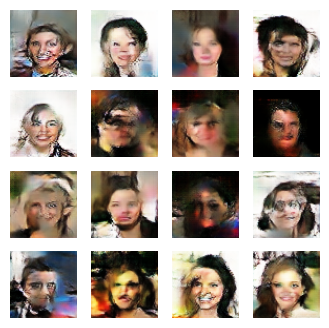

celebGenerated_wgan_370epochs


Output of the calculating FID command:
FID:  58.19829193183148

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.99769057  49.5071717   38.

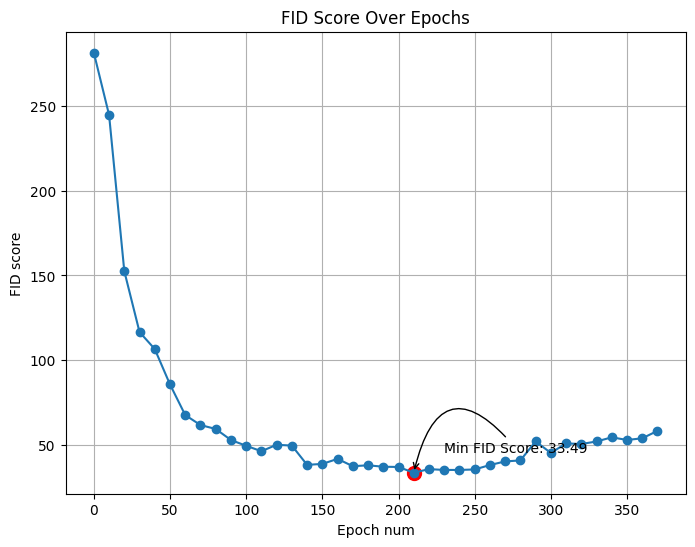

81/81 [==============================] - 28s 344ms/step - d_loss: -0.2360 - g_loss: -52.0751
Epoch 372/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2007 - g_loss: -51.6095
Epoch 373/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.8313 - g_loss: 18.4283
Epoch 374/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.8975 - g_loss: 0.9910
Epoch 375/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5151 - g_loss: 7.8115
Epoch 376/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2275 - g_loss: 44.8523
Epoch 377/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6057 - g_loss: 135.5099
Epoch 378/802
81/81 [==============================] - 11s 137ms/step - d_loss: -0.9737 - g_loss: 188.3822
Epoch 379/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0243 - g_loss: 154.0659
Epoch 380/802
81/81 [==============================] - 11

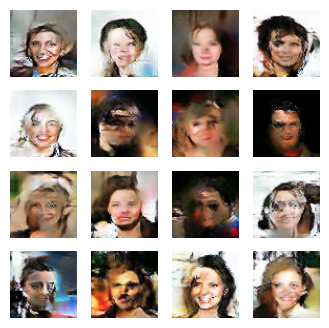

celebGenerated_wgan_380epochs


Output of the calculating FID command:
FID:  60.05776924181387

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.18532244  49.9976905

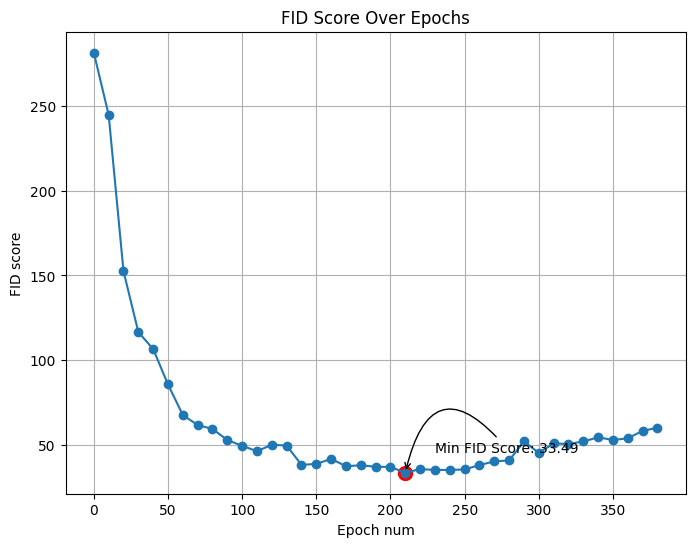

81/81 [==============================] - 28s 343ms/step - d_loss: -1.0576 - g_loss: -59.0906
Epoch 382/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4190 - g_loss: -78.8772
Epoch 383/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3707 - g_loss: -10.5380
Epoch 384/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3749 - g_loss: 47.0701
Epoch 385/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7308 - g_loss: 63.0129
Epoch 386/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3184 - g_loss: 52.6345
Epoch 387/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4129 - g_loss: -5.0668
Epoch 388/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0182 - g_loss: -52.5858
Epoch 389/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.5794 - g_loss: -66.6295
Epoch 390/802
81/81 [==============================] - 

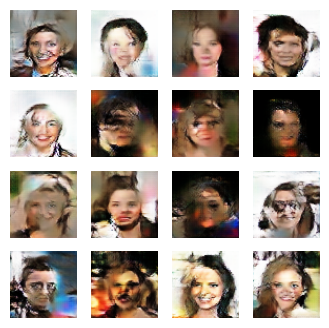

celebGenerated_wgan_390epochs


Output of the calculating FID command:
FID:  56.98545964678567

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568
  49.39114551  46.1

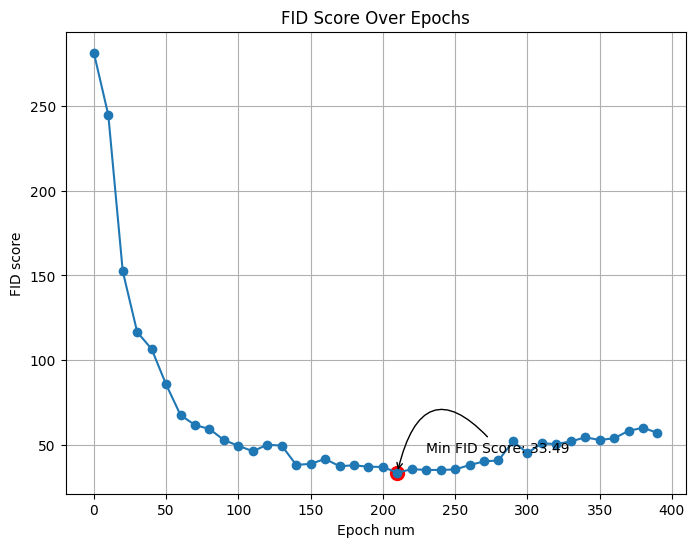

81/81 [==============================] - 28s 342ms/step - d_loss: -1.9528 - g_loss: 67.7634
Epoch 392/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3477 - g_loss: 120.6510
Epoch 393/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7410 - g_loss: 81.5364
Epoch 394/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6338 - g_loss: 33.1668
Epoch 395/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9807 - g_loss: -13.1318
Epoch 396/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9705 - g_loss: -73.6294
Epoch 397/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8104 - g_loss: -158.0518
Epoch 398/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0389 - g_loss: -153.9985
Epoch 399/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.1327 - g_loss: -120.8639
Epoch 400/802
81/81 [==============================

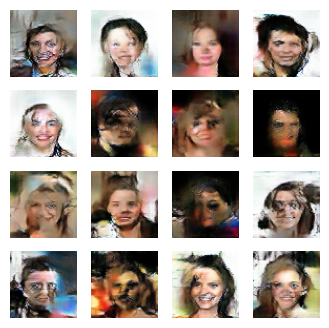

celebGenerated_wgan_400epochs


Output of the calculating FID command:
FID:  58.24016887560657

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567, 58.24016887560657]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.33863149  52.79945568


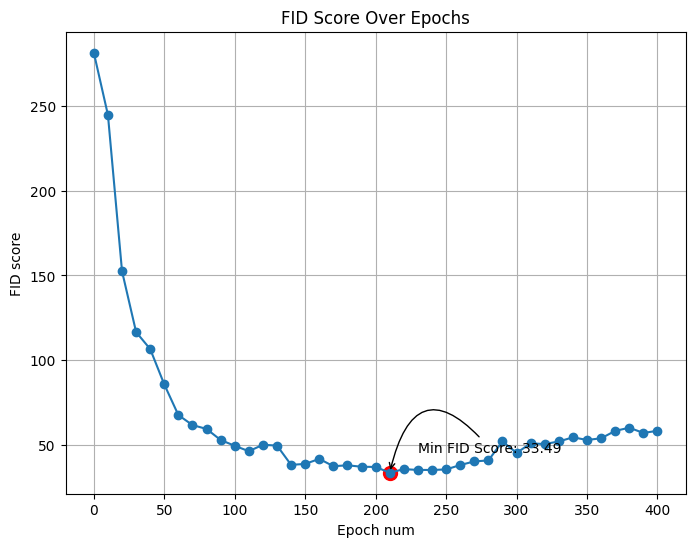

81/81 [==============================] - 29s 354ms/step - d_loss: -2.0083 - g_loss: -86.1199
Epoch 402/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2685 - g_loss: -13.5692
Epoch 403/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0520 - g_loss: 19.1839
Epoch 404/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.8781 - g_loss: -49.7351
Epoch 405/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.5107 - g_loss: -121.5825
Epoch 406/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4073 - g_loss: -134.0399
Epoch 407/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.2080 - g_loss: -131.0827
Epoch 408/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0557 - g_loss: -149.5667
Epoch 409/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7074 - g_loss: -48.5513
Epoch 410/802
81/81 [===========================

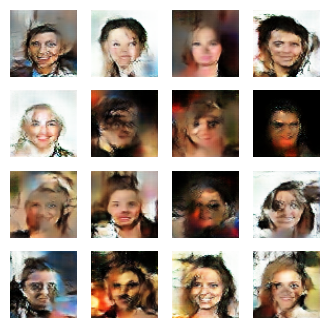

celebGenerated_wgan_410epochs


Output of the calculating FID command:
FID:  60.509519620925346

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567, 58.24016887560657, 60.509519620925346]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402    61.6341473   59.3

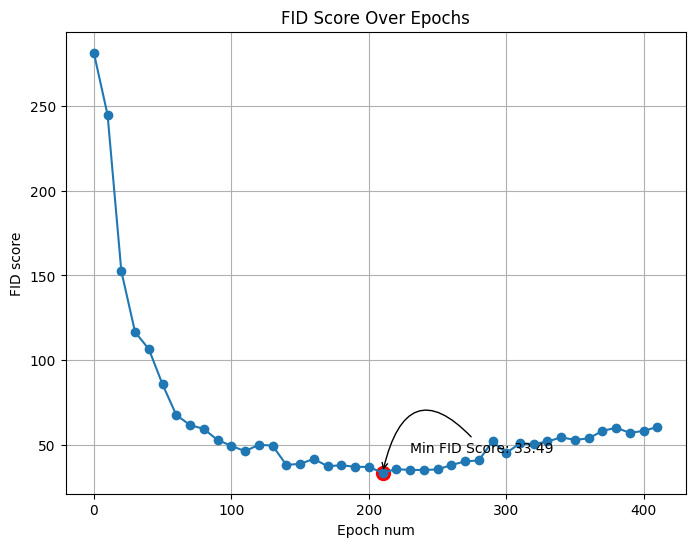

81/81 [==============================] - 29s 354ms/step - d_loss: -1.0757 - g_loss: 59.3696
Epoch 412/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.4640 - g_loss: 70.3674
Epoch 413/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.9777 - g_loss: 81.9155
Epoch 414/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.3478 - g_loss: 132.5061
Epoch 415/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9433 - g_loss: 79.4543
Epoch 416/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2413 - g_loss: 11.5867
Epoch 417/802
81/81 [==============================] - 11s 137ms/step - d_loss: -1.7220 - g_loss: -51.0624
Epoch 418/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3548 - g_loss: -92.9280
Epoch 419/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8538 - g_loss: -167.0842
Epoch 420/802
81/81 [==============================] - 

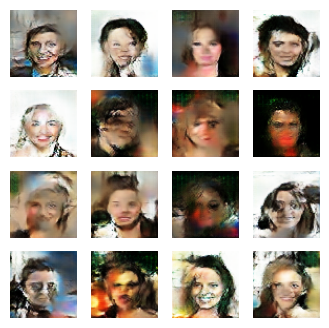

celebGenerated_wgan_420epochs


Output of the calculating FID command:
FID:  66.51854356768786

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567, 58.24016887560657, 60.509519620925346, 66.51854356768786]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.61406589  67.535402   

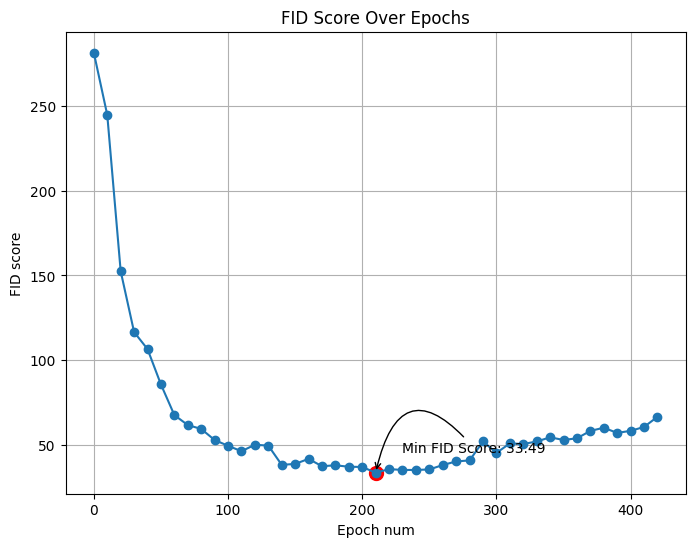

81/81 [==============================] - 28s 343ms/step - d_loss: -1.5135 - g_loss: -185.3141
Epoch 422/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.0610 - g_loss: -132.6664
Epoch 423/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1385 - g_loss: -44.7800
Epoch 424/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.8520 - g_loss: -27.2954
Epoch 425/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.7634 - g_loss: -20.4739
Epoch 426/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6065 - g_loss: -21.0573
Epoch 427/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7394 - g_loss: -8.9444
Epoch 428/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3886 - g_loss: 36.1276
Epoch 429/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2477 - g_loss: 99.6653
Epoch 430/802
81/81 [==============================]

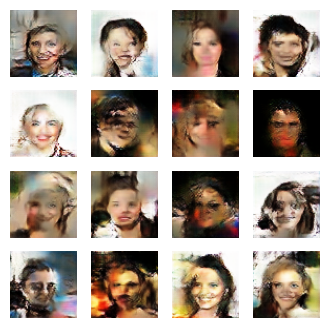

celebGenerated_wgan_430epochs


Output of the calculating FID command:
FID:  64.32460072892496

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567, 58.24016887560657, 60.509519620925346, 66.51854356768786, 64.32460072892496]
[281.51975905 244.79483292 152.52397403 116.54509564 106.51685634
  85.614

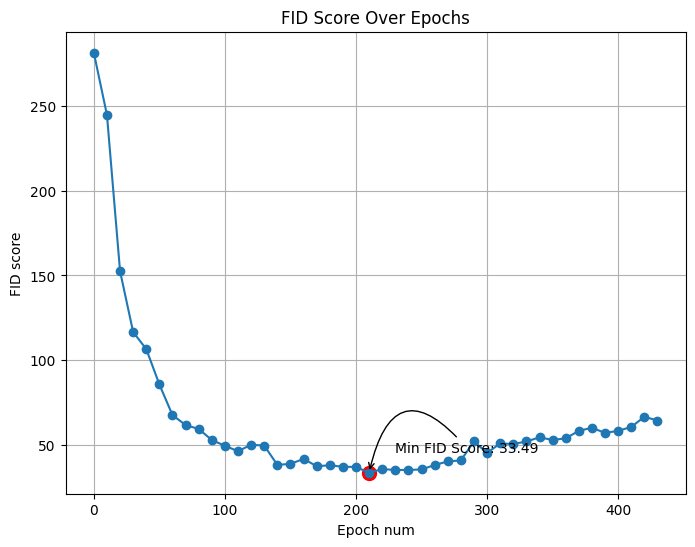

81/81 [==============================] - 28s 346ms/step - d_loss: -2.0099 - g_loss: 155.3139
Epoch 432/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4056 - g_loss: 134.4773
Epoch 433/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0624 - g_loss: 133.7731
Epoch 434/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.0921 - g_loss: 49.9764
Epoch 435/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.8159 - g_loss: 1.2656
Epoch 436/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.3168 - g_loss: -23.5377
Epoch 437/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6340 - g_loss: -10.3095
Epoch 438/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2430 - g_loss: 4.2281
Epoch 439/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.7279 - g_loss: -0.8660
Epoch 440/802
81/81 [==============================] - 11

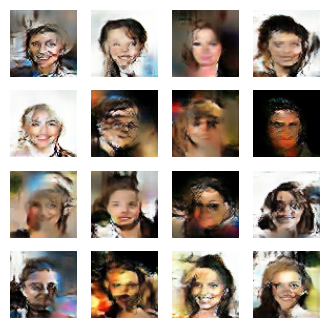

celebGenerated_wgan_440epochs


Output of the calculating FID command:
FID:  65.68035656766685

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567, 58.24016887560657, 60.509519620925346, 66.51854356768786, 64.32460072892496, 65.68035656766685]
[281.51975905 244.79483292 152.52397403 116.54509564 10

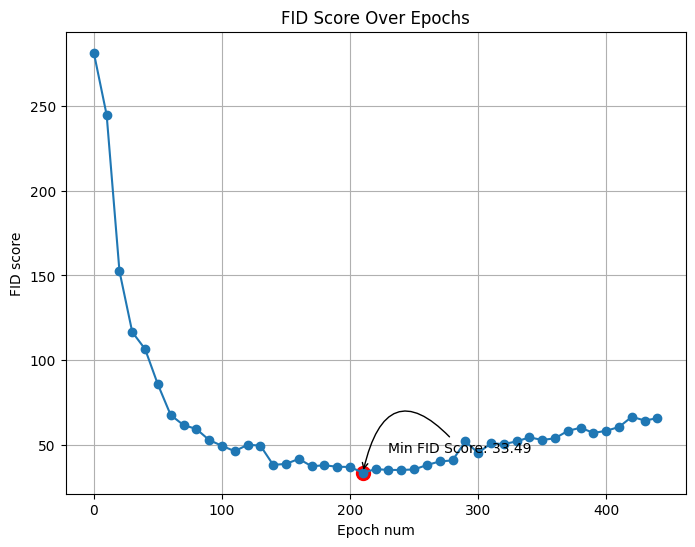

81/81 [==============================] - 28s 348ms/step - d_loss: -2.0173 - g_loss: -200.9180
Epoch 442/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.4826 - g_loss: -237.2343
Epoch 443/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1473 - g_loss: -210.4336
Epoch 444/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.7366 - g_loss: -238.5512
Epoch 445/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1355 - g_loss: -258.6796
Epoch 446/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.2110 - g_loss: -241.9132
Epoch 447/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.4424 - g_loss: -188.9220
Epoch 448/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.1399 - g_loss: -55.6073
Epoch 449/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.9160 - g_loss: -55.3702
Epoch 450/802
81/81 [=======================

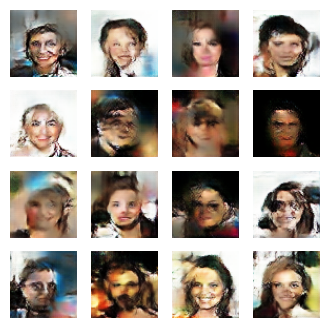

celebGenerated_wgan_450epochs


Output of the calculating FID command:
FID:  69.91487441337193

FID_scores:  [281.519759050974, 244.79483291598387, 152.52397403202963, 116.54509564167415, 106.51685634242997, 85.61406589175817, 67.53540199895576, 61.634147296027805, 59.33863148967498, 52.79945567632154, 49.39114550913678, 46.185322442703296, 49.99769057000978, 49.50717169910604, 38.12733264872793, 38.696157739230614, 41.653033919262384, 37.33476185343574, 37.87409309431624, 37.0216709322944, 36.892405782868565, 33.48703159432284, 35.60786138870776, 35.12983946549525, 35.12568601276712, 35.41333242080054, 38.024755052099295, 40.16103232281256, 40.75251315893456, 51.966815109714645, 45.174283919420105, 50.80379120422165, 50.44784300207408, 51.93379731036137, 54.39313804519932, 52.831299448512624, 53.81554942431114, 58.19829193183148, 60.05776924181387, 56.98545964678567, 58.24016887560657, 60.509519620925346, 66.51854356768786, 64.32460072892496, 65.68035656766685, 69.91487441337193]
[281.51975905 244.79483292 152.52397

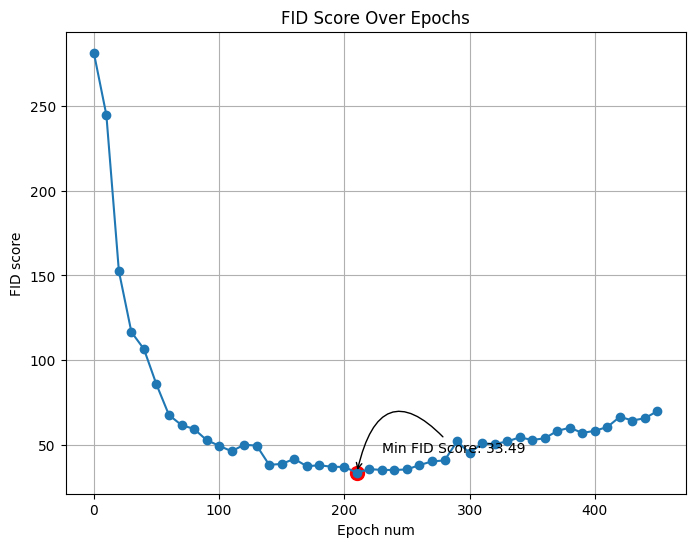

81/81 [==============================] - 29s 358ms/step - d_loss: -1.6713 - g_loss: -85.7328
Epoch 452/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2870 - g_loss: 7.3473
Epoch 453/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6664 - g_loss: 64.2596
Epoch 454/802
81/81 [==============================] - 11s 138ms/step - d_loss: -1.6067 - g_loss: 98.4812
Epoch 455/802
81/81 [==============================] - 11s 138ms/step - d_loss: -0.9914 - g_loss: 218.4784
Epoch 456/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.2972 - g_loss: 199.7453
Epoch 457/802
81/81 [==============================] - 11s 138ms/step - d_loss: -2.3399 - g_loss: 184.4621
Epoch 458/802
76/81 [===========================>..] - ETA: 0s - d_loss: -0.7662 - g_loss: 148.8925

In [ ]:
NUM_EPOCHS = 802 # number of epochs
wgan_gp.fit(train_images, epochs=NUM_EPOCHS, callbacks=[GANMonitor(num_img=16, latent_dim=LATENT_DIM)])